In [1]:
from midir import w1w2_condition
from tqdm import tqdm

import os
import numpy as np
from collections import OrderedDict as od
import scipy
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as tkr
from matplotlib.cm import ScalarMappable
from matplotlib.lines import Line2D
import csv
import matplotlib

try:
    from astropy.convolution import Gaussian2DKernel, convolve
    astro_smooth = True
except ImportError as IE:
    astro_smooth = False

from astropy.io import fits

from astropy.coordinates import match_coordinates_sky as coords
from astropy.coordinates import SkyCoord  # High-level coordinates
from astropy.coordinates import ICRS, Galactic, FK4, FK5  # Low-level frames
from astropy.coordinates import Angle, Latitude, Longitude  # Angles
from matplotlib.ticker import FormatStrFormatter
#from astropy.units import cds
#cds.enable()

from astropy.cosmology import LambdaCDM, FlatLambdaCDM

from astropy.io import ascii
from astropy.io.ascii import masked
from astropy.table import Table

from scipy.interpolate import interp1d
from scipy.stats import gaussian_kde
from numpy import polyfit
from astropy.time import Time

#import uncertainties as unc  
#import uncertainties.unumpy as unp

import kcorrect.response

plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams.update({'font.size': 22})
matplotlib.rc('font',**{'family':'serif','serif':['Times']})
matplotlib.rc('text', usetex=True)

In [2]:
SAVE_FILEPATH = os.path.join(os.path.curdir, 'WISE variations/Final Plots 2.2.0/')
IMPORT_FILEPATH = os.path.join(os.path.curdir, 'WISE variations/')

In [3]:
manga_file = fits.open(IMPORT_FILEPATH + "mnsa-0.3.0.fits")
manga_hdu = manga_file[1]
manga_data = manga_hdu.data

pipe3d_file = fits.open(IMPORT_FILEPATH + 'SDSS17Pipe3D_v3_1_1.fits')
pipe3d_hdu = pipe3d_file[1]
pipe3d_data = pipe3d_hdu.data

wise_file = fits.open(IMPORT_FILEPATH + "manga-wise-variable-0.3.0.fits")
wise_hdu = wise_file[1]
whdu = wise_hdu.data

jiyan_file = fits.open(IMPORT_FILEPATH + "jiyan-agn-0.3.2.fits")
jiyan_hdu = jiyan_file[1]
jhdu = jiyan_hdu.data

summary = manga_file[1].data
sps2 = manga_file[2].data

has_pipe3d = summary['ipipe3d '] != -1
    
sps2_matched = sps2[has_pipe3d]
summary_matched = summary[has_pipe3d]
wise_matched = whdu[has_pipe3d]

pipe3d_matched = pipe3d_data[summary_matched['ipipe3d ']]

In [4]:
t = Table.read(IMPORT_FILEPATH+'/Final Plots 2.2.0/' + 'variability_catalog', format='ascii')
t['Plateifu'].shape

(170,)

In [5]:
t

Plateifu,RA,Dec,W1,W2,$\log_{10}\varsigma^2$,$\text{Var}(W2)$
str11,float64,float64,float64,float64,float64,float64
9870-1902,233.1651,44.5342,17.09000015258789,17.530000686645508,-3.062,-0.3
8145-6102,116.5535,26.923,15.579999923706055,16.049999237060547,-2.585,-0.823
8710-6102,117.9662,49.8143,13.90999984741211,14.270000457763672,-3.913,-0.84
10223-3701,31.5666,-0.2914,13.079999923706055,13.25,-3.854,-0.845
11011-1902,218.7186,48.6619,15.420000076293945,15.630000114440918,-4.131,-0.897
9000-1901,171.4007,54.3826,13.789999961853027,13.75,-4.575,-0.898
8341-12704,189.2133,45.6512,17.850000381469727,18.229999542236328,-3.781,-0.997
8561-3704,241.3254,52.1202,16.93000030517578,17.31999969482422,-3.656,-1.084
8940-12702,120.0874,26.6135,12.65999984741211,12.65999984741211,-4.137,-1.085


In [6]:
pifu = t['Plateifu'].data
varW2 = t[r'$\text{Var}(W2)$'].data
varsigma=t[r'$\log_{10}\varsigma^2$'].data

In [7]:
w2 = []
w1 = []

w2_err = []
w1_err = []

times = []
manga_date = []

for i in pifu:
    date = Time(whdu[whdu['plateifu'] == i]['mjd'], format='mjd')
    times.append(date.to_value('decimalyear').reshape(-1))
    
    w2.append(whdu[whdu['plateifu'] == i]['mean_W2_per_epoch'].reshape(-1))
    w1.append(whdu[whdu['plateifu'] == i]['mean_W1_per_epoch'].reshape(-1))
    
    w2_err.append(whdu[whdu['plateifu'] == i]['err_W2_per_epoch'].reshape(-1))
    w1_err.append(whdu[whdu['plateifu'] == i]['err_W1_per_epoch'].reshape(-1))
    
    mdate = Time(manga_data[manga_data['plateifu'] == i]['mjdmed'], format='mjd')
    manga_date.append(mdate.to_value('decimalyear').reshape(-1))

C:\Users\paiaa\anaconda3\Lib\site-packages\erfa\core.py:154: ErfaWarning: ERFA function "d2dtf" yielded 2 of "dubious year (Note 5)"
  warnings.warn('ERFA function "{}" yielded {}'.format(func_name, wmsg),
C:\Users\paiaa\anaconda3\Lib\site-packages\erfa\core.py:154: ErfaWarning: ERFA function "dtf2d" yielded 2 of "dubious year (Note 6)"
  warnings.warn('ERFA function "{}" yielded {}'.format(func_name, wmsg),
C:\Users\paiaa\anaconda3\Lib\site-packages\erfa\core.py:154: ErfaWarning: ERFA function "dtf2d" yielded 4 of "dubious year (Note 6)"
  warnings.warn('ERFA function "{}" yielded {}'.format(func_name, wmsg),
C:\Users\paiaa\anaconda3\Lib\site-packages\erfa\core.py:154: ErfaWarning: ERFA function "d2dtf" yielded 3 of "dubious year (Note 5)"
  warnings.warn('ERFA function "{}" yielded {}'.format(func_name, wmsg),
C:\Users\paiaa\anaconda3\Lib\site-packages\erfa\core.py:154: ErfaWarning: ERFA function "dtf2d" yielded 3 of "dubious year (Note 6)"
  warnings.warn('ERFA function "{}" yielded

In [8]:
for i, array in enumerate(w2):
    ind = np.isfinite(array)
    
    w2[i] = array[ind]
    w1[i] = w1[i][ind]
    
    w2_err[i] = w2_err[i][ind]
    w1_err[i] = w1_err[i][ind]
    times[i] = times[i][ind]
    

In [9]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.model_selection import train_test_split
from sklearn.gaussian_process.kernels import WhiteKernel, RBF, ConstantKernel, Matern, RationalQuadratic

In [ ]:
N = 0 
gp_x2 = []
gp_meanpred2, gp_stdpred2 = [], []
for i in range(pifu.shape[0]):
    X = times[i]
    Y = w2[i]
    Y_err = w2_err[i]
    Y_err[~np.isfinite(Y_err)] = 0
    #print(Y_err)
    #print(X)
    #print(Y)
    #print(X.shape, Y.shape)
    print(Y_err)
    Y_noise = np.random.normal(loc=0, scale=Y_err, size=Y_err.shape[0])
#     if i in [24, 28, 31, 37, 39, 41, 42, 44, 45]:
#         kernel =  1*Matern(length_scale=50, length_scale_bounds=(1, 1e3), nu=1.5)#RationalQuadratic(length_scale=1, length_scale_bounds=(1e-6, 1e6)) +
#         gaussian_process = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=20, alpha=Y_err**2)
#     else:
    kernel =  1*Matern(length_scale=1, length_scale_bounds=(1e-5, 1.5e1), nu=1.5)#RationalQuadratic(length_scale=1, length_scale_bounds=(1e-6, 1e6)) +
    gaussian_process = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=20, alpha=Y_err**2, normalize_y=True)
    
    x = np.linspace(min(X), max(X), 500)
    gaussian_process.fit(X.reshape(-1,1), Y+ Y_noise)
    mean_prediction, std_prediction = gaussian_process.predict(x.reshape(-1,1), return_std=True)

    gp_x2.append(x)
    gp_meanpred2.append(mean_prediction)
    gp_stdpred2.append(std_prediction)
    print(gaussian_process.kernel_)
    


[0.12467678 0.13631438 0.15267307 0.14487436 0.18214604 0.17186415
 0.17143016 0.18311733 0.22810326 0.21170321 0.1664331  0.21150449
 0.07352045 0.07131111 0.06885775 0.02872289 0.06333059 0.06406222
 0.07581191]
0.953**2 * Matern(length_scale=1.37, nu=1.5)
[0.184      0.363      0.203      0.3        0.07212489]
0.934**2 * Matern(length_scale=0.000286, nu=1.5)
[0.03622229 0.02854663 0.03256374 0.02840301 0.02684674 0.02097832
 0.02237744 0.03437407 0.02821542 0.03408774 0.02557543 0.0263385
 0.04154463 0.02791044 0.12669458 0.01569501 0.02740859 0.03478232]
1.03**2 * Matern(length_scale=1.02, nu=1.5)
[0.02911308 0.02680485 0.02668435 0.01900299 0.03484558 0.03066357
 0.05416697 0.03472518 0.0792139  0.02936324 0.01948361 0.02493122
 0.02501091 0.1154915  0.02199388 0.01554852 0.02508933 0.0396836
 0.02778107 0.04827662]
1.19**2 * Matern(length_scale=1.25, nu=1.5)
[0.03507835 0.03054401 0.03168452 0.03541799 0.03993674 0.05771126
 0.05117902 0.04129391 0.02334229 0.03806911 0.03095646

0.997**2 * Matern(length_scale=0.453, nu=1.5)
[0.03888925 0.04904234 0.01819733 0.02303973 0.02283694 0.01882204
 0.02654884 0.01598958 0.03284423 0.02251398 0.02919018 0.03285079
 0.05565662 0.03489517 0.02685707 0.02102956 0.08738122 0.0246561
 0.03958146]
1.16**2 * Matern(length_scale=1.26, nu=1.5)
[0.02541451 0.01198182 0.01729728 0.02646725 0.02667107 0.024887
 0.03178469 0.02427566 0.01971022 0.12907052 0.02964022 0.02390528
 0.13257501 0.01751483 0.02290029 0.07284275 0.02439106 0.02108851]
0.984**2 * Matern(length_scale=0.585, nu=1.5)
[0.05772232 0.06104061 0.0500185  0.04875771 0.0715632  0.0472074
 0.02801334 0.04054491 0.03239444 0.03373322 0.0333266  0.07119913
 0.0420235  0.0530897  0.03042167 0.03634826 0.07254914 0.05089219
 0.0559464 ]
0.972**2 * Matern(length_scale=0.836, nu=1.5)
[0.03659053 0.03120837 0.0303989  0.02336401 0.0333316  0.04359471
 0.02757328 0.01955462 0.03621826 0.02297345 0.02940992 0.02580812
 0.03100754 0.02590422 0.03599489 0.02195785 0.03094242 0.

C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


0.994**2 * Matern(length_scale=1e-05, nu=1.5)
[0.05951632 0.05698655 0.06221644 0.05871804 0.07562577 0.0625715
 0.11638255 0.05018402 0.05525825 0.05497289 0.05633305 0.07805807
 0.09775812 0.07066525 0.09292484 0.07035898 0.05552331 0.09640547]
0.975**2 * Matern(length_scale=0.469, nu=1.5)
[0.0428789  0.05427355 0.05303079 0.04714284 0.03365365 0.04772356
 0.04027113 0.05922658 0.17102995 0.0355929  0.03924128 0.10959716
 0.03368568 0.05128613 0.04780643 0.04590991 0.10848692 0.05200612]
0.926**2 * Matern(length_scale=0.639, nu=1.5)
[0.03082679 0.02017424 0.03229534 0.04701514 0.0192281  0.02416647
 0.02017678 0.03140324 0.01604799 0.02030152 0.02289684 0.03297272
 0.03671147 0.02176928 0.02274174 0.03328538 0.04531807 0.02499089]
1.08**2 * Matern(length_scale=0.567, nu=1.5)
[0.21672359 0.018      0.01670662 0.02249444 0.02419075 0.03453779
 0.01556876 0.01672614 0.01544099 0.01416659 0.01915645 0.01768838
 0.01413056 0.03222008 0.01687454 0.02241022 0.0328564  0.01813535
 0.01791241

C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:419: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


0.999**2 * Matern(length_scale=1e-05, nu=1.5)
[0.07496518 0.07240289 0.0747984  0.08322385 0.07994407 0.07927274
 0.09191172 0.06888095 0.07804016 0.08035585 0.1072113  0.10910904
 0.07638667 0.09365078 0.05672022 0.1139742  0.06446339 0.11982773
 0.09157106 0.08684074]
1.01**2 * Matern(length_scale=0.354, nu=1.5)
[0.07496518 0.07240289 0.0747984  0.08322385 0.07994407 0.07927274
 0.09191172 0.06888095 0.07804016 0.08035585 0.1072113  0.10910904
 0.07638667 0.09365078 0.05672022 0.1139742  0.06446339 0.11982773
 0.09157106 0.08684074]
1.02**2 * Matern(length_scale=0.525, nu=1.5)
[0.84510772 0.05046055 0.06647054 0.04277261 0.04892511 0.07034439
 0.0539731  0.07980804 0.05414475 0.05038297 0.07589903 0.06522266
 0.05320536 0.07266745 0.06489146 0.05800255 0.04949343 0.05793403
 0.06513148]
1.52**2 * Matern(length_scale=2.46, nu=1.5)
[0.04109407 0.02827611 0.05048366 0.05871556 0.0364101  0.03414779
 0.04733618 0.04449813 0.04599112 0.04351595 0.04972173 0.03832402
 0.07659036 0.05981615

1.04**2 * Matern(length_scale=0.671, nu=1.5)
[0.03776719 0.03720573 0.03430837 0.03635667 0.03308439 0.04435552
 0.03345893 0.04483989 0.04835834 0.04267665 0.03226572 0.03607683
 0.04877407 0.03884278 0.0512153  0.03009216 0.04456557 0.02972205
 0.02705814]
1.02**2 * Matern(length_scale=0.355, nu=1.5)
[0.02752022 0.02796082 0.03022645 0.02215037 0.02414382 0.02396962
 0.02199213 0.02523391 0.03034952 0.02771767 0.0315539  0.02917305
 0.034337   0.02246585 0.02717637 0.02382134 0.02009478 0.02577596
 0.02029941]
1.02**2 * Matern(length_scale=0.764, nu=1.5)
[0.06173849 0.029      0.029      0.031      0.031      0.039     ]
1.35**2 * Matern(length_scale=3.36, nu=1.5)
[0.06235818 0.09130717 0.06993326 0.11878099 0.06620405 0.1053962
 0.05849881 0.08985438 0.09264905 0.08630437 0.08664006 0.13005933
 0.07616668 0.08988567 0.14168059 0.05714101 0.12293449 0.08436231
 0.3148312 ]
0.973**2 * Matern(length_scale=0.356, nu=1.5)
[0.02413481 0.01863769 0.02648391 0.03132133 0.02966198 0.02050087

In [ ]:
gaussian_process.get_params()

In [ ]:
fig, axes = plt.subplots(figsize=(16,22), ncols=3, nrows=5, sharex=True)
plt.subplots_adjust(hspace=0)
i = 0
for j, ax in enumerate(axes.ravel()):
    if (i+j)> 14:
            ax.set_axis_off()
            continue
    if whdu[whdu['plateifu']==pifu[i+j]]['vi_flag']==1:
        ax.errorbar(times[i + j], w2[i + j], yerr=w2_err[i + j], ls='none', capsize = 2, elinewidth = 1.5,  linewidth = 1.5, color = 'maroon', marker = 'o', mfc = 'maroon', markersize = 4, markevery = 1)
        ymin, ymax = w2[i+j].min(), w2[i+j].max()
        ax.plot(gp_x2[i + j], gp_meanpred2[i + j], color='red', lw=2)
        ax.fill_between(gp_x2[i + j], gp_meanpred2[i + j] - gp_stdpred2[i + j], gp_meanpred2[i + j] + gp_stdpred2[i + j], alpha=0.3, color='lightcoral')
        ax.vlines(manga_date[i + j], ymin=ymin-0.45, ymax=ymax+0.25, lw=10, color='gray', alpha=0.4)
        ax.text(.96, .95, r'\textit{'+pifu[i+j]+'}', ha='right', va='top', fontsize=18, fontstyle='oblique', bbox=dict(facecolor='white', edgecolor='k'), transform=ax.transAxes, zorder=5)
        ax.text(.04, .95, r'${\rm LV}(W2)='+str(np.round(varW2[i+j],1))+'$\n'+r'${\rm L}\varsigma^2='+str(np.round(varsigma[i+j],1))+'$', ha='left', va='top', fontsize=18, bbox=dict(facecolor='white', edgecolor='k'), transform=ax.transAxes, zorder=5)

    if whdu[whdu['plateifu']==pifu[i+j]]['vi_flag']==0:
        ax.errorbar(times[i + j], w2[i + j], yerr=w2_err[i + j], ls='none', capsize = 2, elinewidth = 1.5,  linewidth = 1.5, color = 'seagreen', marker = 'o', mfc = 'seagreen', markersize = 4, markevery = 1)
        ymin, ymax = w2[i+j].min(), w2[i+j].max()
        ax.plot(gp_x2[i + j], gp_meanpred2[i + j], color='royalblue', lw=2)
        ax.fill_between(gp_x2[i + j], gp_meanpred2[i + j] - gp_stdpred2[i + j], gp_meanpred2[i + j] + gp_stdpred2[i + j], alpha=0.3, color='cornflowerblue')
        ax.vlines(manga_date[i + j], ymin=ymin-0.45, ymax=ymax+0.25, lw=10, color='gray', alpha=0.4)
        ax.text(.96, .95, r'\textit{'+pifu[i+j]+'}' , ha='right', va='top', fontsize=18, fontstyle='oblique', bbox=dict(facecolor='white', edgecolor='k'), transform=ax.transAxes, zorder=5)
        ax.text(.04, .95, r'${\rm LV}(W2)='+str(np.round(varW2[i+j],1))+'$\n'+r'${\rm L}\varsigma^2='+str(np.round(varsigma[i+j],1))+'$', ha='left', va='top', fontsize=18, bbox=dict(facecolor='white', edgecolor='k'), transform=ax.transAxes, zorder=5)

    if j in [0, 3, 6, 9, 12, 15]:
        ax.set_ylabel('W2')
    if j in [15, 16, 17]:
        ax.set_xlabel('year')
    if i == 159 and j in [8, 9, 10]:
        ax.set_xlabel('year') 
        ax.xaxis.set_tick_params(labelbottom=True)
    #ax.legend()
    ax.set_ylim(ymin-0.4, ymax+0.15)
    ax.invert_yaxis()
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    ax.set_yticks(ticks=[ymin-0.25, (ymin-0.25+ymax)/2, ymax], labels=[np.round(ymin-0.25,1), np.round((ymin-0.25+ymax)/2,1), np.round(ymax,1)], fontsize=18)

#plt.savefig(SAVE_FILEPATH + '/WISE lightcurves/' + 'lightcurves_gp_errs' + str(i//18) + '.png',  bbox_inches = 'tight', pad_inches = 0.1, dpi = 300)

In [ ]:
index = np.arange(0, pifu.shape[0], 18)

for i in index[1:]-3:
    
    fig, axes = plt.subplots(figsize=(16, 22), ncols=3, nrows=6, sharex=True)
    plt.subplots_adjust(hspace=0)
    
    for j, ax in enumerate(axes.ravel()):

        #break loop since we only have 170 objects
        if (i+j)> 169:
            ax.set_axis_off()
            continue
        if whdu[whdu['plateifu']==pifu[i+j]]['vi_flag']==1:
            ax.errorbar(times[i + j], w2[i + j], yerr=w2_err[i + j], ls='none', capsize = 2, elinewidth = 1.5,  linewidth = 1.5, color = 'maroon', marker = 'o', mfc = 'maroon', markersize = 4, markevery = 1)
            ymin, ymax = w2[i+j].min(), w2[i+j].max()
            ax.plot(gp_x2[i + j], gp_meanpred2[i + j], color='red', lw=2)
            ax.fill_between(gp_x2[i + j], gp_meanpred2[i + j] - gp_stdpred2[i + j], gp_meanpred2[i + j] + gp_stdpred2[i + j], alpha=0.3, color='lightcoral')
            ax.vlines(manga_date[i + j], ymin=ymin-0.45, ymax=ymax+0.25, lw=10, color='gray', alpha=0.4)
            ax.text(.96, .95, r'\textit{'+pifu[i+j]+'}', ha='right', va='top', fontsize=18, fontstyle='oblique', bbox=dict(facecolor='white', edgecolor='k'), transform=ax.transAxes, zorder=5)
            ax.text(.04, .95, r'${\rm LV}(W2)='+str(np.round(varW2[i+j],1))+'$\n'+r'${\rm L}\varsigma^2='+str(np.round(varsigma[i+j],1))+'$', ha='left', va='top', fontsize=18, bbox=dict(facecolor='white', edgecolor='k'), transform=ax.transAxes, zorder=5)
            
        if whdu[whdu['plateifu']==pifu[i+j]]['vi_flag']==0:
            ax.errorbar(times[i + j], w2[i + j], yerr=w2_err[i + j], ls='none', capsize = 2, elinewidth = 1.5,  linewidth = 1.5, color = 'seagreen', marker = 'o', mfc = 'seagreen', markersize = 4, markevery = 1)
            ymin, ymax = w2[i+j].min(), w2[i+j].max()
            ax.plot(gp_x2[i + j], gp_meanpred2[i + j], color='royalblue', lw=2)
            ax.fill_between(gp_x2[i + j], gp_meanpred2[i + j] - gp_stdpred2[i + j], gp_meanpred2[i + j] + gp_stdpred2[i + j], alpha=0.3, color='cornflowerblue')
            ax.vlines(manga_date[i + j], ymin=ymin-0.45, ymax=ymax+0.25, lw=10, color='gray', alpha=0.4)
            ax.text(.96, .95, r'\textit{'+pifu[i+j]+'}' , ha='right', va='top', fontsize=18, fontstyle='oblique', bbox=dict(facecolor='white', edgecolor='k'), transform=ax.transAxes, zorder=5)
            ax.text(.04, .95, r'${\rm LV}(W2)='+str(np.round(varW2[i+j],1))+'$\n'+r'${\rm L}\varsigma^2='+str(np.round(varsigma[i+j],1))+'$', ha='left', va='top', fontsize=18, bbox=dict(facecolor='white', edgecolor='k'), transform=ax.transAxes, zorder=5)
            
        if j in [0, 3, 6, 9, 12, 15]:
            ax.set_ylabel('W2')
        if j in [15, 16, 17]:
            ax.set_xlabel('year')
        if i == 159 and j in [8, 9, 10]:
            ax.set_xlabel('year') 
            ax.xaxis.set_tick_params(labelbottom=True)
        #ax.legend()
        ax.set_ylim(ymin-0.4, ymax+0.15)
        ax.invert_yaxis()
        ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
        ax.set_yticks(ticks=[ymin-0.25, (ymin-0.25+ymax)/2, ymax], labels=[np.round(ymin-0.25,1), np.round((ymin-0.25+ymax)/2,1), np.round(ymax,1)], fontsize=18)
        
    #plt.savefig(SAVE_FILEPATH + '/WISE lightcurves/' + 'lightcurves_gp_errs' + str((i+3)//18) + '.png',  bbox_inches = 'tight', pad_inches = 0.1, dpi = 300)

In [106]:
index-3

array([ -3,  15,  33,  51,  69,  87, 105, 123, 141, 159])

In [115]:
ind

array([  0,  15,  33,  51,  69,  87, 105, 123, 141, 159])

In [64]:
print(whdu[whdu['plateifu']=='9870-1902']['observed_W2_var'], np.log10(whdu[whdu['plateifu']=='9870-1902']['expected_W2_var_all_mags']))
cut = ((np.log10(whdu['observed_W2_var'])>-3.1) & (np.log10(whdu['observed_W2_var'])<-2.7) & (np.log10(whdu['expected_W2_var_all_mags'])<-2.9) & (np.log10(whdu['expected_W2_var_all_mags'])>-3.1))
whdu['plateifu'][cut][1:25]

[0.50147051] [-3.0622019]


C:\Users\paiaa\AppData\Local\Temp\ipykernel_412\272320086.py:2: RuntimeWarning: invalid value encountered in log10
  cut = ((np.log10(whdu['observed_W2_var'])>-3.1) & (np.log10(whdu['observed_W2_var'])<-2.7) & (np.log10(whdu['expected_W2_var_all_mags'])<-2.9) & (np.log10(whdu['expected_W2_var_all_mags'])>-3.1))


chararray(['10001-3703', '10001-9102', '10213-12701', '10214-12701',
           '10214-12702', '10214-12705', '10214-6101', '10214-6102',
           '10214-9102', '10215-12704', '10216-1902', '10216-3703',
           '10216-6102', '10216-6103', '10217-12702', '10217-6103',
           '10217-9102', '10218-3702', '10218-6101', '10220-12705',
           '10220-3702', '10221-9101', '10222-12704', '10222-1902'],
          dtype='<U12')

In [73]:
print(whdu[whdu['plateifu']=='9094-6101']['observed_W2_var'], np.log10(whdu[whdu['plateifu']=='9094-6101']['expected_W2_var_all_mags']))
cut = ((np.log10(whdu['observed_W2_var'])>-3.1) & (np.log10(whdu['observed_W2_var'])<-2.7) & (np.log10(whdu['expected_W2_var_all_mags'])<-3.9) & (np.log10(whdu['expected_W2_var_all_mags'])>-4.1))
whdu['plateifu'][cut]

[0.05881741] [-3.9916274]


C:\Users\paiaa\AppData\Local\Temp\ipykernel_412\3991546629.py:2: RuntimeWarning: invalid value encountered in log10
  cut = ((np.log10(whdu['observed_W2_var'])>-3.1) & (np.log10(whdu['observed_W2_var'])<-2.7) & (np.log10(whdu['expected_W2_var_all_mags'])<-3.9) & (np.log10(whdu['expected_W2_var_all_mags'])>-4.1))


chararray(['10508-6101', '10514-9102', '11010-6104', '11021-6104',
           '11025-12705', '11025-6104', '11751-6101', '11761-12705',
           '11940-12705', '11941-1902', '11942-3703', '11943-3703',
           '11944-6101', '11945-6101', '11947-3702', '11949-1901',
           '11952-3704', '11963-9102', '11969-3703', '11976-3701',
           '12078-1902', '12518-3703', '12624-6104', '12667-3704',
           '12673-6101', '12674-12703', '12674-6103', '12675-1902',
           '12675-3702', '7957-3701', '7957-6103', '7961-12702',
           '7961-6103', '7977-12705', '7990-3703', '7991-12702',
           '8087-12701', '8311-3703', '8312-9102', '8313-6102',
           '8314-9102', '8332-9102', '8337-6104', '8338-1902',
           '8441-6102', '8445-12702', '8464-6101', '8482-3702',
           '8482-3703', '8483-3703', '8484-12703', '8484-3702',
           '8485-9102', '8487-12702', '8546-3702', '8547-9101',
           '8550-12701', '8550-6101', '8553-6102', '8555-6101',
           '85

In [65]:
w2nv = []
timesnv = []
w2nv_err = []
manga_datenv = []
for i in np.array(['10217-9102','7957-6103']):
    date = Time(whdu[whdu['plateifu'] == i]['mjd'], format='mjd')
    timesnv.append(date.to_value('decimalyear').reshape(-1))
    
    w2nv.append(whdu[whdu['plateifu'] == i]['mean_W2_per_epoch'].reshape(-1))
    
    w2nv_err.append(whdu[whdu['plateifu'] == i]['err_W2_per_epoch'].reshape(-1))

    
    mdate = Time(manga_data[manga_data['plateifu'] == i]['mjdmed'], format='mjd')
    manga_datenv.append(mdate.to_value('decimalyear').reshape(-1))   

In [66]:
for i, array in enumerate(w2nv):
    ind = np.isfinite(array)
    
    w2nv[i] = array[ind]
    
    w2nv_err[i] = w2nv_err[i][ind]
    timesnv[i] = timesnv[i][ind]

In [67]:
N = 0 
gpx2 = []
gp_mp2, gp_sp2 = [], []
for i in range(2):
    X = timesnv[i]
    Y = w2nv[i]
    Y_err = w2nv_err[i]
    Y_err[~np.isfinite(Y_err)] = 0
    #print(Y_err)
    #print(X)
    #print(Y)
    #print(X.shape, Y.shape)
    print(Y_err)
    Y_noise = np.random.normal(loc=0, scale=Y_err, size=Y_err.shape[0])
#     if i in [24, 28, 31, 37, 39, 41, 42, 44, 45]:
#         kernel =  1*Matern(length_scale=50, length_scale_bounds=(1, 1e3), nu=1.5)#RationalQuadratic(length_scale=1, length_scale_bounds=(1e-6, 1e6)) +
#         gaussian_process = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=20, alpha=Y_err**2)
#     else:
    kernel =  1*Matern(length_scale=1, length_scale_bounds=(1e-5, 1.5e1), nu=1.5)#RationalQuadratic(length_scale=1, length_scale_bounds=(1e-6, 1e6)) +
    gaussian_process = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=20, alpha=Y_err**2)
    
    x = np.linspace(min(X), max(X), 500)
    gaussian_process.fit(X.reshape(-1,1), Y+ Y_noise)
    mean_prediction, std_prediction = gaussian_process.predict(x.reshape(-1,1), return_std=True)

    gpx2.append(x)
    gp_mp2.append(mean_prediction)
    gp_sp2.append(std_prediction)

[0.07642171 0.061      0.0825319  0.03037835 0.04411916 0.09644457
 0.11230559 0.08932463 0.08570129 0.08335877 0.1073192  0.08765336
 0.09632353 0.06392203 0.07999653 0.11615105 0.10843137 0.12577978
 0.07365181]
[0.03721989 0.04635409 0.03970293 0.04716511 0.04879746 0.03663524
 0.04578923 0.04136197 0.03665216 0.02895833 0.04252504 0.03722678
 0.05319168 0.04084104 0.05239476 0.02904869 0.03633745 0.04084688
 0.05911397]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 15.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 15.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


In [70]:
varW2nv, varsigmanv = [], []
varW2nv.append(np.log10(whdu[whdu['plateifu']=='10217-9102']['observed_W2_var'][0]))
varW2nv.append(np.log10(whdu[whdu['plateifu']=='7957-6103']['observed_W2_var'][0]))

varsigmanv.append(np.log10(whdu[whdu['plateifu']=='10217-9102']['expected_W2_var_all_mags'][0]))
varsigmanv.append(np.log10(whdu[whdu['plateifu']=='7957-6103']['expected_W2_var_all_mags'][0]))

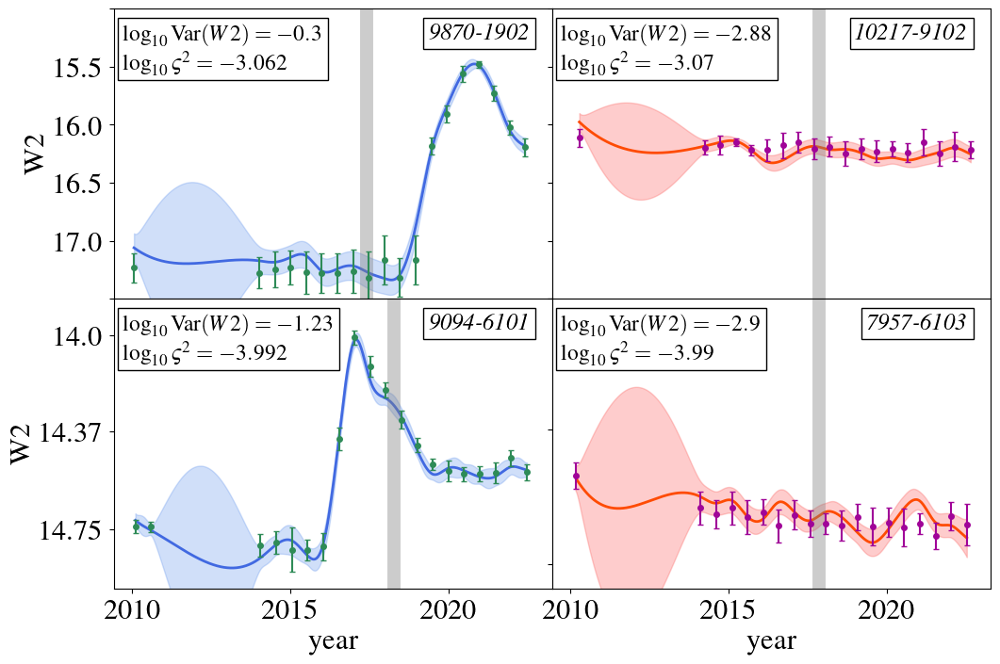

In [80]:
fig, axes = plt.subplots(figsize=(12,8), ncols=2, nrows=2, sharex=True)
plt.subplots_adjust(hspace=0.0)
axa, axb = axes

axa1, axa2 = axa
axb1, axb2 = axb

axa1.errorbar(times[0], w2[0], yerr=w2_err[0], ls='none', capsize = 2, elinewidth = 1.5,  linewidth = 1.5, color = 'seagreen', marker = 'o', mfc = 'seagreen', markersize = 4, markevery = 1, zorder=10)
ymin, ymax = w2[0].min(), w2[0].max()
axa1.plot(gp_x2[0], gp_meanpred2[0], color='royalblue', lw=2)
axa1.fill_between(gp_x2[0], gp_meanpred2[0] - gp_stdpred2[0], gp_meanpred2[0] + gp_stdpred2[0], alpha=0.3, color='cornflowerblue')
axa1.vlines(manga_date[0], ymin=ymin-0.5, ymax=ymax+0.25, lw=10, color='gray', alpha=0.4)
axa1.text(.95, .95, r'\textit{'+pifu[0]+'}', ha='right', va='top', fontsize=18, fontstyle='oblique', bbox=dict(facecolor='white', edgecolor='k'), transform=axa1.transAxes, zorder=5)
axa1.text(.02, .95,r'$\log_{10}{\rm Var}(W2)='+str(varW2[0])+'$\n'+r'$\log_{10}\varsigma^2='+str(varsigma[0])+'$', ha='left', va='top', fontsize=17, fontstyle='oblique', bbox=dict(facecolor='white', edgecolor='k'), transform=axa1.transAxes, zorder=-1)

axa1.set_ylim(ymin-0.15, ymax+0.15)
axa1.invert_yaxis()
axa1.set_yticks([17.5, 17.0, 16.5, 16.0, 15.5, 15.0],['', 17.0, 16.5, 16.0, 15.5, ''])
axa1.set_ylabel('W2')

axb1.errorbar(times[13], w2[13], yerr=w2_err[13], ls='none', capsize = 2, elinewidth = 1.5,  linewidth = 1.5, color = 'seagreen', marker = 'o', mfc = 'seagreen', markersize = 4, markevery = 1, zorder=10)
ymin, ymax = w2[13].min(), w2[13].max()
axb1.plot(gp_x2[13], gp_meanpred2[13], color='royalblue', lw=2)
axb1.fill_between(gp_x2[13], gp_meanpred2[13] - gp_stdpred2[13], gp_meanpred2[13] + gp_stdpred2[13], alpha=0.3, color='cornflowerblue')
axb1.vlines(manga_date[13], ymin=ymin-0.4, ymax=ymax+0.25, lw=10, color='gray', alpha=0.4)
axb1.text(.95, .95, r'\textit{'+pifu[13]+'}', ha='right', va='top', fontsize=18, fontstyle='oblique', bbox=dict(facecolor='white', edgecolor='k'), transform=axb1.transAxes, zorder=5)
axb1.text(.02, .95,r'$\log_{10}{\rm Var}(W2)='+str(varW2[13])+'$\n'+r'$\log_{10}\varsigma^2='+str(varsigma[13])+'$', ha='left', va='top', fontsize=17, fontstyle='oblique', bbox=dict(facecolor='white', edgecolor='k'), transform=axb1.transAxes, zorder=-1)


axb1.set_ylim(ymin-0.15, ymax+0.15)
axb1.invert_yaxis()
axb1.set_yticks([14.75, 14.37, 14.0],[14.75, 14.37, 14.0])
axb1.set_ylabel('W2')
axb1.set_xlabel('year')

axa2.errorbar(timesnv[0], w2nv[0], yerr=w2nv_err[0], ls='none', capsize = 2, elinewidth = 1.5,  linewidth = 1.5, color = '#a00498', marker = 'o', mfc = '#a00498', markersize = 4, markevery = 1, zorder=10)
ymin, ymax = w2nv[0].min(), w2nv[0].max()
axa2.plot(gpx2[0], gp_mp2[0], color='#fe4b03', lw=2)
axa2.fill_between(gpx2[0], gp_mp2[0] - gp_sp2[0], gp_mp2[0] + gp_sp2[0], alpha=0.3, color='#fd5956')
axa2.vlines(manga_datenv[0], ymin=ymin-2, ymax=ymax+2, lw=10, color='gray', alpha=0.4)
axa2.text(.95, .95, r'\textit{'+'10217-9102'+'}' , ha='right', va='top', fontsize=18, fontstyle='oblique', bbox=dict(facecolor='white', edgecolor='k'), transform=axa2.transAxes, zorder=5)
axa2.text(.02, .95,r'$\log_{10}{\rm Var}(W2)='+str(np.round(varW2nv[0],2))+'$\n'+r'$\log_{10}\varsigma^2='+str(np.round(varsigmanv[0],2))+'$', ha='left', va='top', fontsize=17, fontstyle='oblique', bbox=dict(facecolor='white', edgecolor='k'), transform=axa2.transAxes, zorder=-1)

axa2.set_ylim(ymin-0.15, ymax+0.15)
axa2.invert_yaxis()
axa2.set_yticks([17.5, 17.0, 16.5, 16.0, 15.5, 15.0],['', '', '', '', '', ''])


axb2.errorbar(timesnv[1], w2nv[1], yerr=w2nv_err[1], ls='none', capsize = 2, elinewidth = 1.5,  linewidth = 1.5, color = '#a00498', marker = 'o', mfc = '#a00498', markersize = 4, markevery = 1, zorder=10)
ymin, ymax = w2nv[1].min(), w2nv[1].max()
axb2.plot(gpx2[1], gp_mp2[1], color='#fe4b03', lw=2)
axb2.fill_between(gpx2[1], gp_mp2[1] - gp_sp2[1], gp_mp2[1] + gp_sp2[1], alpha=0.3, color='#fd5956')
axb2.vlines(manga_datenv[0], ymin=ymin-0.6, ymax=ymax+0.25, lw=10, color='gray', alpha=0.4)
axb2.text(.95, .95, r'\textit{'+'7957-6103'+'}' , ha='right', va='top', fontsize=18, fontstyle='oblique', bbox=dict(facecolor='white', edgecolor='k'), transform=axb2.transAxes, zorder=5)
axb2.text(.02, .95,r'$\log_{10}{\rm Var}(W2)='+str(np.round(varW2nv[1],2))+'$\n'+r'$\log_{10}\varsigma^2='+str(np.round(varsigmanv[1],2))+'$', ha='left', va='top', fontsize=17, fontstyle='oblique', bbox=dict(facecolor='white', edgecolor='k'), transform=axb2.transAxes, zorder=-1)

axb2.set_ylim(ymin-0.15, ymax+0.15)
axb2.invert_yaxis()
axb2.set_yticks([14.75, 14.37, 14.0],['', '', ''])
axb2.set_xlabel('year')

fig.subplots_adjust(wspace=0.0)

#plt.savefig(SAVE_FILEPATH+'lightcurves_var_vs_nonvar.png', bbox_inches = 'tight', pad_inches = 0.1, dpi = 300)

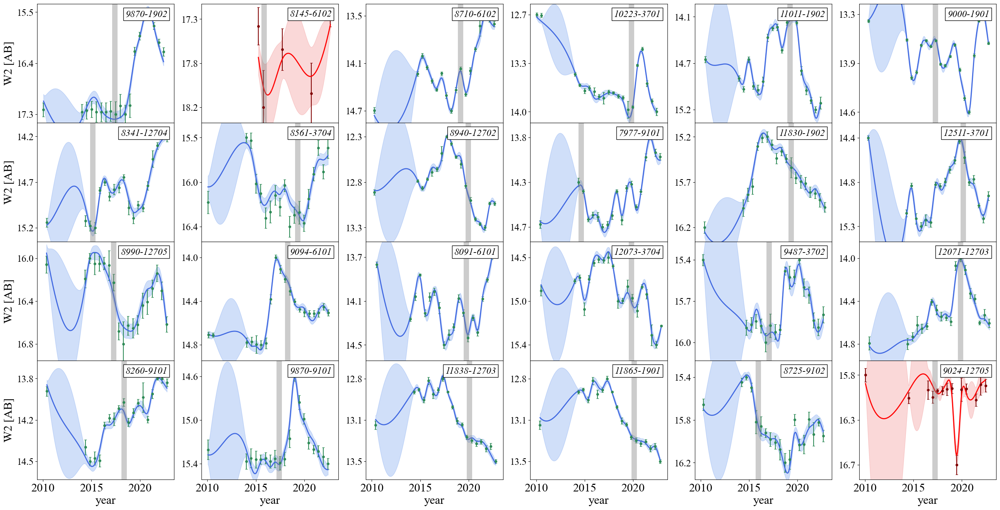

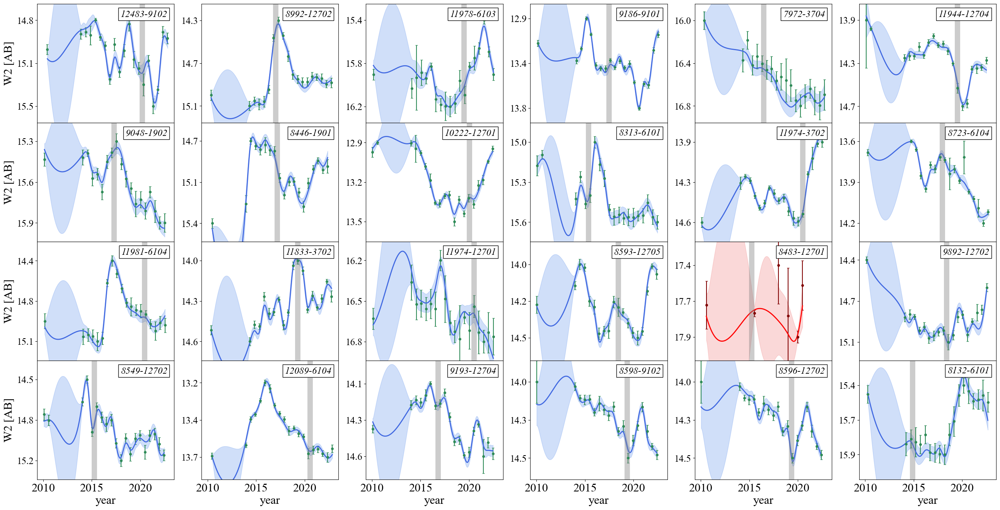

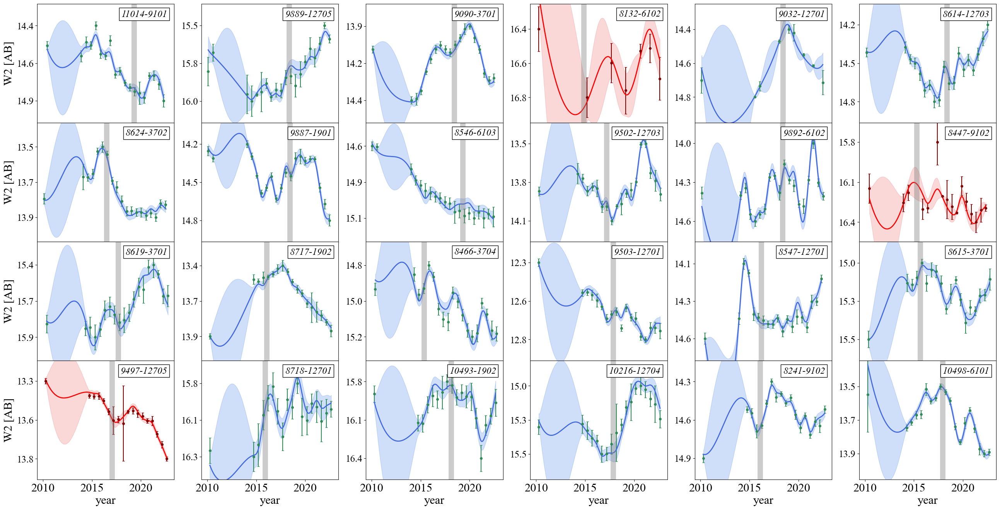

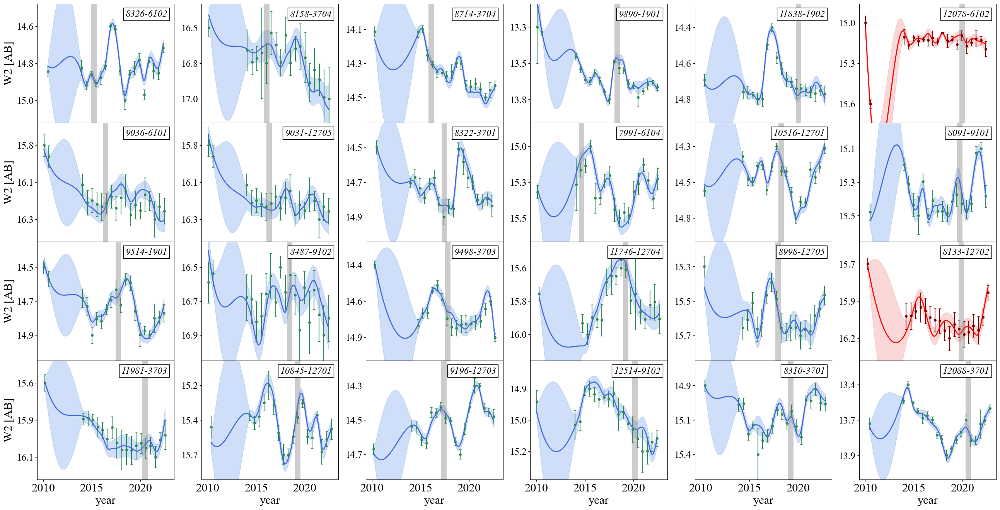

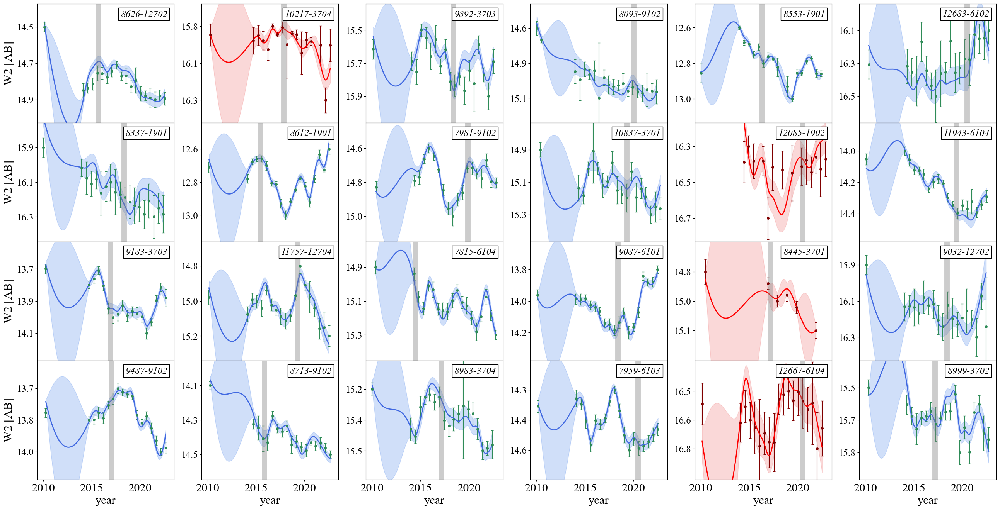

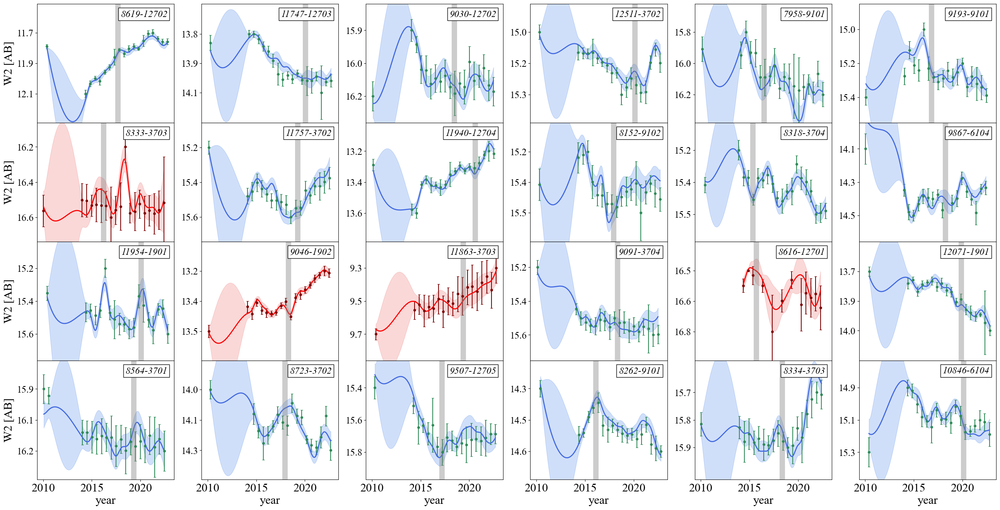

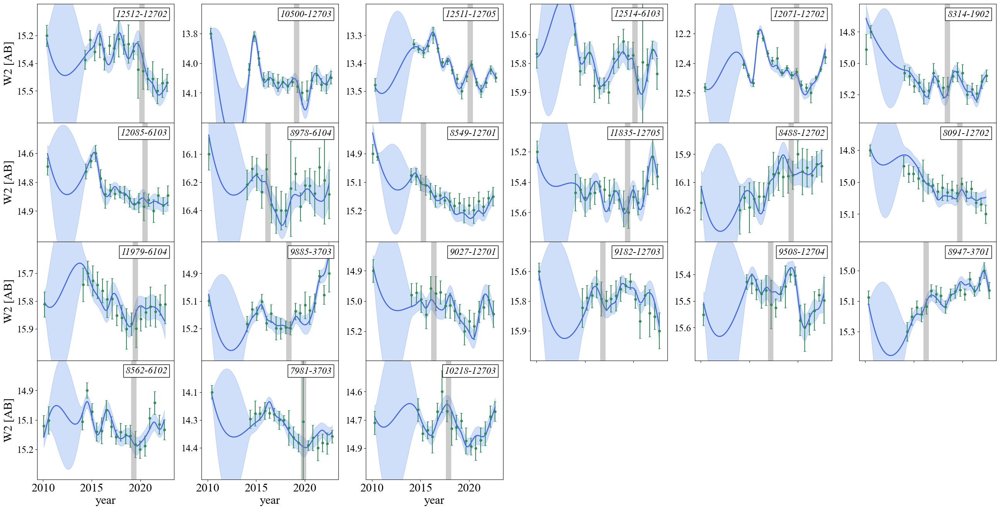

In [24]:
index = np.arange(0, pifu.shape[0], 24)

for i in index:
    
    fig, axes = plt.subplots(figsize=(32, 16), ncols=6, nrows=4, sharex=True)
    plt.subplots_adjust(hspace=0)
    
    for j, ax in enumerate(axes.ravel()):

        #break loop since we only have 172 objects
        if (i+j)> 164:
            ax.set_axis_off()
            continue
        if whdu[whdu['plateifu']==pifu[i+j]]['vi_flag']==1:
            ax.errorbar(times[i + j], w2[i + j], yerr=w2_err[i + j], ls='none', capsize = 2, elinewidth = 1.5,  linewidth = 1.5, color = 'maroon', marker = 'o', mfc = 'maroon', markersize = 4, markevery = 1)
            ymin, ymax = w2[i+j].min(), w2[i+j].max()
            ax.plot(gp_x2[i + j], gp_meanpred2[i + j], color='red', lw=2)
            ax.fill_between(gp_x2[i + j], gp_meanpred2[i + j] - gp_stdpred2[i + j], gp_meanpred2[i + j] + gp_stdpred2[i + j], alpha=0.3, color='lightcoral')
            ax.vlines(manga_date[i + j], ymin=ymin-0.4, ymax=ymax+0.25, lw=10, color='gray', alpha=0.4)
            ax.text(.95, .95, pifu[i+j], ha='right', va='top', fontsize=18, fontstyle='oblique', bbox=dict(facecolor='white', edgecolor='k'), transform=ax.transAxes, zorder=5)
        
        if whdu[whdu['plateifu']==pifu[i+j]]['vi_flag']==0:
            ax.errorbar(times[i + j], w2[i + j], yerr=w2_err[i + j], ls='none', capsize = 2, elinewidth = 1.5,  linewidth = 1.5, color = 'seagreen', marker = 'o', mfc = 'seagreen', markersize = 4, markevery = 1)
            ymin, ymax = w2[i+j].min(), w2[i+j].max()
            ax.plot(gp_x2[i + j], gp_meanpred2[i + j], color='royalblue', lw=2)
            ax.fill_between(gp_x2[i + j], gp_meanpred2[i + j] - gp_stdpred2[i + j], gp_meanpred2[i + j] + gp_stdpred2[i + j], alpha=0.3, color='cornflowerblue')
            ax.vlines(manga_date[i + j], ymin=ymin-0.4, ymax=ymax+0.25, lw=10, color='gray', alpha=0.4)
            ax.text(.95, .95, pifu[i+j], ha='right', va='top', fontsize=18, fontstyle='oblique', bbox=dict(facecolor='white', edgecolor='k'), transform=ax.transAxes, zorder=5)

        if j in [0, 6, 12, 18]:
            ax.set_ylabel('W2 [AB]')
        if j in [18, 19, 20, 21, 22, 23]:
            ax.set_xlabel('year')
        if i == 162 and j in [0, 1, 2]:
            ax.set_xlabel('year') 
            ax.xaxis.set_tick_params(labelbottom=True)
        #ax.legend()
        ax.set_ylim(ymin-0.15, ymax+0.15)
        ax.invert_yaxis()
        ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
        ax.set_yticks(ticks=[ymin, (ymin+ymax)/2, ymax], labels=[np.round(ymin,1), np.round((ymin+ymax)/2,1), np.round(ymax,1)], fontsize=18)
        
    plt.savefig(SAVE_FILEPATH + '/WISE lightcurves/' + 'lightcurves_gp_errs_talk' + str(i//18) + '.png',  bbox_inches = 'tight', pad_inches = 0.1, dpi = 300)

In [13]:
np.where(t['Plateifu']=='9094-6101'), np.where(t['Plateifu']=='9870-9101')

((array([13], dtype=int64),), (array([19], dtype=int64),))

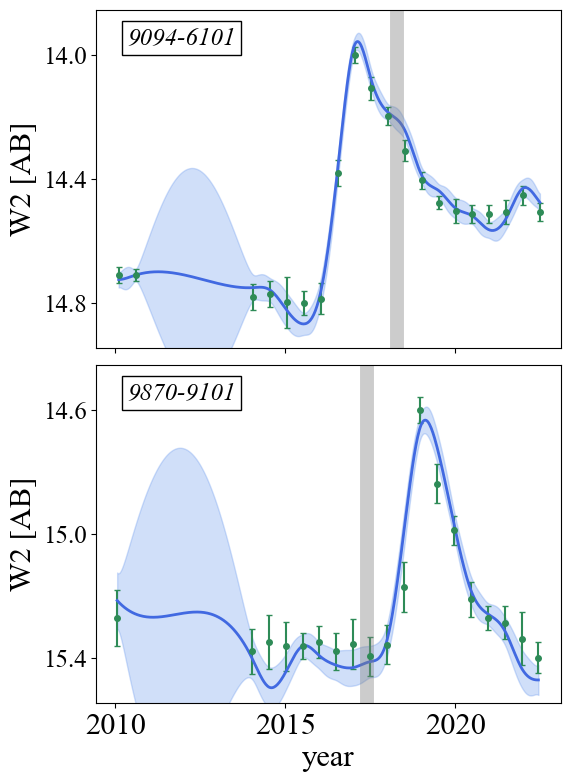

In [33]:
fig, ax = plt.subplots(figsize=(6,9), nrows=2, sharex=True)
axa, axb = ax

axa.errorbar(times[13], w2[13], yerr=w2_err[13], ls='none', capsize = 2, elinewidth = 1.5,  linewidth = 1.5, color = 'seagreen', marker = 'o', mfc = 'seagreen', markersize = 4, markevery = 1)
ymin, ymax = w2[13].min(), w2[13].max()
axa.plot(gp_x2[13], gp_meanpred2[13], color='royalblue', lw=2)
axa.fill_between(gp_x2[13], gp_meanpred2[13] - gp_stdpred2[13], gp_meanpred2[13] + gp_stdpred2[13], alpha=0.3, color='cornflowerblue')
axa.vlines(manga_date[13], ymin=ymin-0.4, ymax=ymax+0.25, lw=10, color='gray', alpha=0.4)
axa.text(.3, .95, pifu[13], ha='right', va='top', fontsize=18, fontstyle='oblique', bbox=dict(facecolor='white', edgecolor='k'), transform=axa.transAxes, zorder=5)


axa.set_ylim(ymin-0.15, ymax+0.15)
axa.invert_yaxis()
axa.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
axa.set_yticks(ticks=[ymin, (ymin+ymax)/2, ymax], labels=[np.round(ymin,1), np.round((ymin+ymax)/2,1), np.round(ymax,1)], fontsize=18)
axa.set_ylabel('W2 [AB]')

axb.errorbar(times[19], w2[19], yerr=w2_err[19], ls='none', capsize = 2, elinewidth = 1.5,  linewidth = 1.5, color = 'seagreen', marker = 'o', mfc = 'seagreen', markersize = 4, markevery = 1)
ymin, ymax = w2[19].min(), w2[19].max()
axb.plot(gp_x2[19], gp_meanpred2[19], color='royalblue', lw=2)
axb.fill_between(gp_x2[19], gp_meanpred2[19] - gp_stdpred2[19], gp_meanpred2[19] + gp_stdpred2[19], alpha=0.3, color='cornflowerblue')
axb.vlines(manga_date[19], ymin=ymin-0.4, ymax=ymax+0.25, lw=10, color='gray', alpha=0.4)
axb.text(.3, .95, pifu[19], ha='right', va='top', fontsize=18, fontstyle='oblique', bbox=dict(facecolor='white', edgecolor='k'), transform=axb.transAxes, zorder=5)


axb.set_ylim(ymin-0.15, ymax+0.15)
axb.invert_yaxis()
axb.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
axb.set_yticks(ticks=[ymin, (ymin+ymax)/2, ymax], labels=[np.round(ymin,1), np.round((ymin+ymax)/2,1), np.round(ymax,1)], fontsize=18)
axb.set_ylabel('W2 [AB]')
axb.set_xlabel('year') 
plt.subplots_adjust(hspace=0.05)


#plt.savefig(SAVE_FILEPATH + '/WISE lightcurves/' + 'lightcurves_gp_errs_talk.png',  bbox_inches = 'tight', pad_inches = 0.1, dpi = 300)


In [12]:
N = 0 
gp_x1 = []
gp_meanpred1, gp_stdpred1 = [], []
for i in range(50):
    X = times[i]
    Y = w1[i]
    Y_err = w1_err[i]
    Y_err[~np.isfinite(Y_err)] = 0
    #print(Y_err)
    #print(X)
    #print(Y)
    #print(X.shape, Y.shape)
    print(Y_err)
    Y_noise = np.random.normal(loc=0, scale=Y_err, size=Y_err.shape[0])
#     if i in [24, 28, 31, 37, 39, 41, 42, 44, 45]:
#         kernel =  1*Matern(length_scale=50, length_scale_bounds=(1, 1e3), nu=1.5)#RationalQuadratic(length_scale=1, length_scale_bounds=(1e-6, 1e6)) +
#         gaussian_process = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=20, alpha=Y_err**2)
#     else:
    kernel =  1*Matern(length_scale=1, length_scale_bounds=(1e-5, 1e1), nu=1.5)#RationalQuadratic(length_scale=1, length_scale_bounds=(1e-6, 1e6)) +
    gaussian_process = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=20, alpha=Y_err**2)
    
    x = np.linspace(min(X), max(X), 500)
    gaussian_process.fit(X.reshape(-1,1), Y+ Y_noise)
    mean_prediction, std_prediction = gaussian_process.predict(x.reshape(-1,1), return_std=True)

    gp_x1.append(x)
    gp_meanpred1.append(mean_prediction)
    gp_stdpred1.append(std_prediction)
    print(gaussian_process.kernel_)

[0.04616121 0.06937593 0.11778167 0.07047798 0.06064992 0.07813768
 0.06600917 0.05436427 0.08602493 0.07086698 0.06236758 0.06514149
 0.05030464 0.04782472 0.04777389 0.03235183 0.05184487 0.0467622
 0.05373783]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


6.14**2 * Matern(length_scale=10, nu=1.5)
[0.075      0.072      0.059      0.074      0.14142136]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


7.47**2 * Matern(length_scale=10, nu=1.5)
[0.0400899  0.02827791 0.01603202 0.03093817 0.06097216 0.02166972
 0.01672777 0.02193741 0.03729339 0.02318266 0.02370113 0.0419744
 0.02859763 0.0187657  0.01466869 0.0181882  0.0275918  0.023555  ]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


6.47**2 * Matern(length_scale=10, nu=1.5)
[0.02377574 0.03953276 0.0349324  0.05062758 0.02891366 0.03409425
 0.04532601 0.05531451 0.03989878 0.04868675 0.02336308 0.05247506
 0.0548156  0.05133557 0.04843063 0.04224698 0.01664101 0.02274097
 0.04712717 0.03310944]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


7.01**2 * Matern(length_scale=10, nu=1.5)
[0.04231211 0.03601063 0.03698366 0.03222976 0.0422188  0.02906236
 0.03211048 0.02537814 0.0285337  0.05192499 0.05591555 0.02304944
 0.03010804 0.03399706 0.04231348 0.07058209 0.03526851 0.02692465
 0.03186399]
9.68**2 * Matern(length_scale=9.91, nu=1.5)
[0.01509291 0.00997202 0.02878683 0.02103271 0.027355   0.02575396
 0.01994278 0.02036853 0.02115939 0.02097207 0.01526202 0.01701124
 0.01467637 0.02861985 0.02183575 0.01654322 0.01721904 0.01805873
 0.02962286]
9.49**2 * Matern(length_scale=9.04, nu=1.5)
[0.0698193  0.03967746 0.07232138 0.03829861 0.04240396 0.04528951
 0.05746265 0.03873068 0.03368948 0.04388764 0.03855028 0.03618442
 0.04625419 0.04805791 0.04439152 0.04865603 0.02775442 0.02909496
 0.03748971]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


4.74**2 * Matern(length_scale=10, nu=1.5)
[0.06734326 0.04422061 0.03885569 0.03320388 0.04706068 0.05608717
 0.05172702 0.04493596 0.04051756 0.04774857 0.05466399 0.0442977
 0.03857913 0.0339313  0.06751103 0.04725006 0.06583325 0.05754547
 0.03563523]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


5.68**2 * Matern(length_scale=10, nu=1.5)
[0.0460937  0.03207214 0.0203385  0.03896362 0.03104091 0.02045153
 0.02735123 0.02008373 0.01783499 0.02846146 0.03211109 0.02327473
 0.01995187 0.03600062 0.02884252 0.03094743 0.02581965 0.02496397]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


5.08**2 * Matern(length_scale=10, nu=1.5)
[0.05235866 0.03959766 0.03027693 0.04141488 0.0364251  0.03719477
 0.0333432  0.05562334 0.03534228 0.0296089  0.0307946  0.04283044
 0.04570895 0.02767035 0.0546362  0.0224599  0.03008309 0.03196538
 0.02195491]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


7.53**2 * Matern(length_scale=10, nu=1.5)
[0.03964829 0.05966541 0.03729376 0.04772172 0.02934581 0.02898386
 0.0371127  0.04827436 0.03118896 0.0290783  0.05626859 0.04930582
 0.04697915 0.03301339 0.04148362 0.0520416  0.03310186 0.03695785
 0.06371789]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


4.33**2 * Matern(length_scale=10, nu=1.5)
[0.02154207 0.02292716 0.04903172 0.02986119 0.03460388 0.04031828
 0.02759247 0.02593742 0.02944474 0.02360387 0.03967682 0.03360946
 0.02747033 0.02867752 0.03783949 0.02524982 0.02068494 0.03217919
 0.03866681]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


8.44**2 * Matern(length_scale=10, nu=1.5)
[0.041021   0.04505679 0.03709216 0.05610789 0.05133974 0.05122072
 0.04580858 0.05876436 0.0542246  0.05033242 0.043909   0.05701863
 0.06392987 0.06617641 0.04710884 0.05452516 0.04092744 0.03598382
 0.06347713]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


5.48**2 * Matern(length_scale=10, nu=1.5)
[0.04089855 0.03423183 0.04135328 0.04278896 0.02959297 0.02884758
 0.02623185 0.034166   0.04509176 0.0299711  0.026109   0.03573071
 0.0340537  0.02825573 0.03405432 0.02912374 0.03938819 0.02942935
 0.05201725 0.03080816]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


4.02**2 * Matern(length_scale=10, nu=1.5)
[0.04630383 0.04120393 0.03266084 0.03611402 0.04664372 0.04264538
 0.02163709 0.03770178 0.0545916  0.04321933 0.0328993  0.03239011
 0.05269373 0.02924318 0.02837199 0.05201282 0.04559739 0.03625691
 0.03109282]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


8.38**2 * Matern(length_scale=10, nu=1.5)
[0.03673232 0.04031693 0.03338113 0.03355479 0.0222991  0.02257352
 0.02263355 0.02089365 0.0168954  0.01413828 0.04415392 0.05442064
 0.0486083  0.03342597 0.03528101 0.03288575 0.02728036 0.04139442
 0.0311512  0.0417193 ]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


8.18**2 * Matern(length_scale=10, nu=1.5)
[0.04914049 0.04356361 0.04465743 0.03846177 0.04208532 0.04135806
 0.03795257 0.04530636 0.03777379 0.0371729  0.04385099 0.03256685
 0.03621677 0.02399908 0.03991431 0.05073536 0.05470808 0.03568491]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


5.85**2 * Matern(length_scale=10, nu=1.5)
[0.06583975 0.05384229 0.03044541 0.05858994 0.0326577  0.0263563
 0.04135509 0.03559443 0.03920459 0.02734396 0.04869754 0.04138612
 0.01788264 0.05148231 0.08293639 0.05532521 0.03411891 0.03509211
 0.04917039]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


5.01**2 * Matern(length_scale=10, nu=1.5)
[0.04159647 0.03798821 0.0262405  0.05171623 0.06332648 0.03029725
 0.03835159 0.03327776 0.05788741 0.03184719 0.04035177 0.04711304
 0.03456325 0.050875   0.04620574 0.03749051 0.04174468 0.04860127
 0.04322581]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


4.28**2 * Matern(length_scale=10, nu=1.5)
[0.05738919 0.04787322 0.04698344 0.15620709 0.0460635  0.05639208
 0.0646554  0.05481165 0.05845352 0.07482065 0.05245655 0.02953335
 0.04579663 0.05763723 0.06810972 0.0688955  0.04249952 0.03633278
 0.03737869]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


5.28**2 * Matern(length_scale=10, nu=1.5)
[0.01372346 0.01689056 0.02067278 0.02083541 0.02529223 0.02372655
 0.02315071 0.02185541 0.01963716 0.01970618 0.02605406 0.02017615
 0.02431647 0.03440579 0.05265114 0.03234136 0.04528827 0.02682053
 0.02365164]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


5.25**2 * Matern(length_scale=10, nu=1.5)
[0.01372346 0.01689056 0.02067278 0.02083541 0.02529223 0.02372655
 0.02315071 0.02185541 0.01963716 0.01970618 0.02605406 0.02017615
 0.02431647 0.03440579 0.05265114 0.03234136 0.04528827 0.02682053
 0.02365164]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


5.08**2 * Matern(length_scale=10, nu=1.5)
[0.04173896 0.023      0.02211537 0.02758414 0.03692664 0.0466641
 0.02833922 0.02747786 0.05545917 0.07250077 0.09245409 0.02562359
 0.06855675 0.05050865 0.03338515 0.04960911 0.04054146 0.07434441
 0.03550448]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


5.42**2 * Matern(length_scale=10, nu=1.5)
[0.06015301 0.041      0.04389761 0.029      0.04779121 0.0212132
 0.031      0.027      0.03       0.07170019 0.06848357 0.03
 0.09616652 0.029     ]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


4.89**2 * Matern(length_scale=10, nu=1.5)
[0.04480561 0.04876705 0.05079855 0.09053832 0.03353222 0.04302042
 0.02450263 0.05029983 0.0282708  0.05484689 0.08197534 0.0328263
 0.03009144 0.06879078 0.06056805 0.05315329 0.05038083 0.03701032
 0.04221207 0.03212888]
10.4**2 * Matern(length_scale=9.55, nu=1.5)
[0.06353243 0.04166928 0.03032088 0.0993101  0.04125438 0.03269964
 0.04746844 0.03114965 0.04702332 0.20706808 0.0334783  0.03298626
 0.04069572 0.02714091 0.02880282 0.03479493 0.0383294  0.03339205
 0.03335523]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


4.49**2 * Matern(length_scale=10, nu=1.5)
[0.0253208  0.03419137 0.04724125 0.03022843 0.03446727 0.0356094
 0.05791405 0.02030013 0.03781861 0.02676156 0.04832923 0.0430674
 0.03457622 0.03716527 0.04557014 0.03555211 0.02042475 0.03060491
 0.04975389]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


5.28**2 * Matern(length_scale=10, nu=1.5)
[0.03085296 0.03309676 0.03419926 0.02568482 0.0280488  0.02885568
 0.03470644 0.02765367 0.01359162 0.02637297 0.02511752 0.03507946
 0.03591999 0.03236246 0.0377444  0.0280604  0.0386317  0.02504452
 0.03371996]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


7.54**2 * Matern(length_scale=10, nu=1.5)
[0.0464356  0.05258342 0.05790056 0.04376188 0.07281668 0.06130611
 0.04426718 0.06855066 0.0644582  0.05510677 0.04334923 0.03053939
 0.07014228 0.05750621 0.0559119  0.07590165 0.06444397 0.06150391
 0.08213162]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


5.31**2 * Matern(length_scale=10, nu=1.5)
[0.02734436 0.02169677 0.03223786 0.04650658 0.02563907 0.02833809
 0.03306373 0.03105034 0.0208733  0.03352738 0.0251916  0.03983018
 0.02174275 0.02916969 0.04564717 0.03692515 0.03413549 0.03844297
 0.02754552 0.02439466]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


5.64**2 * Matern(length_scale=10, nu=1.5)
[0.02580665 0.05387083 0.0300677  0.02312637 0.02741457 0.05882176
 0.03606747 0.02918563 0.03682025 0.03398627 0.0463981  0.02820018
 0.03411067 0.02863913 0.03458552 0.03795388 0.03807196 0.02512071
 0.0376817 ]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


5.27**2 * Matern(length_scale=10, nu=1.5)
[0.03219061 0.02151965 0.02695623 0.02944845 0.02220501 0.03058954
 0.02597989 0.02410774 0.02666654 0.03851958 0.02857855 0.03443228
 0.05060468 0.02134635 0.02126098 0.02679552 0.0180784  0.03948715
 0.05566661]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


5.08**2 * Matern(length_scale=10, nu=1.5)
[0.04315703 0.04240819 0.02740073 0.02585082 0.02999648 0.02748626
 0.02475278 0.03726644 0.04948545 0.0263227  0.02669831 0.0401577
 0.02978255 0.03854468 0.05010556 0.06761046 0.03195066 0.02643101
 0.03820777 0.02763397]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


3.65**2 * Matern(length_scale=10, nu=1.5)
[0.0503257  0.01857597 0.04201928 0.03116999 0.03660034 0.02443894
 0.03724457 0.03252889 0.03280961 0.04101118 0.03119531 0.02519035
 0.02836103 0.04503028 0.04083941 0.03269279 0.05378653 0.04452258
 0.04239137 0.03174588]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


4.48**2 * Matern(length_scale=10, nu=1.5)
[0.02458502 0.03547727 0.02224341 0.02775968 0.02983115 0.02846446
 0.03707136 0.0239579  0.03713834 0.04082647 0.048698   0.02240992
 0.02566391 0.01868592 0.03416291 0.02990123 0.03558838 0.02156832
 0.03730247]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


4**2 * Matern(length_scale=10, nu=1.5)
[0.01692555 0.0140676  0.01757828 0.02008674 0.02584782 0.02594584
 0.02455082 0.0135287  0.02569392 0.12070294 0.02278617 0.01758977
 0.02066882 0.02728976 0.02594595 0.01931819 0.0225547  0.02147935]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


5.72**2 * Matern(length_scale=10, nu=1.5)
[0.06981114 0.06461556 0.05348582 0.0679082  0.03702726 0.06060539
 0.03160618 0.04574811 0.0289701  0.08179532 0.07701764 0.03306458
 0.04947416 0.0610366  0.03919106 0.04846094 0.035599   0.06020254
 0.06169189]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


4.09**2 * Matern(length_scale=10, nu=1.5)
[0.05171573 0.04710414 0.03505255 0.04669986 0.03315613 0.04297167
 0.01978094 0.02881869 0.03493589 0.02512659 0.03158211 0.03091877
 0.04038014 0.048504   0.03533832 0.0396824  0.03565035 0.02704855
 0.04038724]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


7.35**2 * Matern(length_scale=10, nu=1.5)
[0.06633172 0.04085553 0.13641147 0.05681786 0.05683507 0.10366856
 0.0562217  0.03582589 0.07905122 0.06707571 0.04693136 0.07132655
 0.07057084 0.0850582  0.08583094 0.11619623 0.06322025 0.04444332
 0.06313238]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


6.07**2 * Matern(length_scale=10, nu=1.5)
[0.04181813 0.03881513 0.02405889 0.02590535 0.04177584 0.03240605
 0.03800338 0.04439537 0.03692905 0.04203463 0.02808616 0.04893101
 0.0316899  0.03895828 0.0577883  0.04402124 0.0567915  0.02549272
 0.03113897]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


5.57**2 * Matern(length_scale=10, nu=1.5)
[0.075      0.07495332 0.081      0.086      0.00212132 0.066     ]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


7.83**2 * Matern(length_scale=10, nu=1.5)
[0.02416061 0.0307868  0.02984436 0.02031167 0.03058156 0.0385799
 0.05464659 0.03084679 0.04360122 0.03023375 0.04395585 0.03388356
 0.01912113 0.04099964 0.04350925 0.02456758 0.02779179 0.02521583
 0.03436259]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


4.41**2 * Matern(length_scale=10, nu=1.5)
[0.06141725 0.0304339  0.02556877 0.05944949 0.02858844 0.03359961
 0.02590732 0.03111332 0.03994185 0.05919481 0.0357345  0.03979209
 0.03698157 0.04156082 0.04349764 0.07817318 0.04010827 0.02894404
 0.05395486 0.04264045]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


6.16**2 * Matern(length_scale=10, nu=1.5)
[0.02430563 0.02260588 0.02015982 0.01899821 0.02179616 0.02071077
 0.03460741 0.02276422 0.02214537 0.02962708 0.03165864 0.03087757
 0.02890777 0.02396529 0.03147178 0.02051172 0.0161881  0.03674266
 0.04379422 0.02507489]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


3.85**2 * Matern(length_scale=10, nu=1.5)
[0.0225616  0.02305251 0.01517491 0.02714941 0.02927079 0.0332873
 0.03630165 0.02082741 0.02801091 0.03493279 0.0313885  0.02871841
 0.03576311 0.01590026 0.03540574 0.02890213 0.02661745 0.02903728
 0.0216428 ]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


5.74**2 * Matern(length_scale=10, nu=1.5)
[0.06181447 0.03095881 0.03804311 0.03034007 0.0524098  0.04493169
 0.02909499 0.02768562 0.04411586 0.03456055 0.02771452 0.04085186
 0.03865031 0.03519351 0.03626445 0.03481419 0.04131408 0.0369823
 0.02850236]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


4.03**2 * Matern(length_scale=10, nu=1.5)
[0.06181447 0.03095881 0.03804311 0.03034007 0.0524098  0.04493169
 0.02909499 0.02768562 0.04411586 0.03456055 0.02771452 0.04085186
 0.03865031 0.03519351 0.03626445 0.03481419 0.04131408 0.0369823
 0.02850236]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


3.98**2 * Matern(length_scale=10, nu=1.5)
[0.03405062 0.03261714 0.02459268 0.04209566 0.05828431 0.04711048
 0.05476027 0.03687053 0.03375401 0.0322785  0.0332715  0.03888436
 0.01943374 0.04540291 0.04780575 0.05413343 0.03677147 0.03857932
 0.03707078]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


4.42**2 * Matern(length_scale=10, nu=1.5)
[0.02496226 0.02906745 0.0233429  0.03934756 0.02990133 0.05404274
 0.03388257 0.03758968 0.03215485 0.03912488 0.01612889 0.03320044
 0.02875976 0.02560649 0.04571922 0.04620162 0.0309234  0.03801749
 0.03360918]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


4.43**2 * Matern(length_scale=10, nu=1.5)
[0.07576354 0.03584266 0.00919239 0.13672113 0.01767767 0.03676955
 0.08339265 0.05216321 0.034      0.038      0.0933381  0.031
 0.05016307 0.04388906 0.02052641 0.0375473  0.0612318  0.04242641
 0.04169233 0.05748304]
5.53**2 * Matern(length_scale=10, nu=1.5)


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


In [15]:
indices = np.array([])
for i in range(pifu.shape[0]):
    
    if i in [3, 13, 30, 33, 34, 44]:
        ind1 = np.argmin(np.abs(gp_x2[i]-times[i][1]))
        ind2 = np.argmin(np.abs(gp_x2[i]-times[i][2]))
        
        indices = np.append(indices, [ind1, ind2])
        
    else:
        ind1 = np.argmin(np.abs(gp_x2[i]-times[i][0]))
        ind2 = np.argmin(np.abs(gp_x2[i]-times[i][1]))
        
        indices = np.append(indices, [ind1, ind2])
        
indices = indices.reshape(-1, 2).astype(int)

In [ ]:
index

In [ ]:
index = np.arange(0, 50, 10)
for i in index:
    
    fig, axes = plt.subplots(figsize=(16, 24), ncols=2, nrows=6, sharex=True, constrained_layout=True)
    
    for j, ax in tqdm(enumerate(axes.ravel())):
        
        if i+j in [3, 13, 30, 33, 34, 44]:
            ax.plot(gp_x2[i+j][indices[i+j][0]:indices[i+j][1]], gp_meanpred2[i+j][indices[i+j][0]:indices[i+j][1]], lw=2, ls='-', c='k', zorder=4, label='No data available')
        elif i+j in [1, 20, 37]:
            ax.plot(gp_x2[i+j][indices[i+j][0]:indices[i+j][0]], gp_meanpred2[i+j][indices[i+j][0]:indices[i+j][0]], lw=2, ls='-', c='k', zorder=4, label='No data available')

        elif i+j not in  [3, 13, 30, 33, 34, 44]:
            ax.plot(gp_x2[i+j][indices[i+j][0]:indices[i+j][1]], gp_meanpred2[i+j][indices[i+j][0]:indices[i+j][1]], lw=2, ls='-', c='k', zorder=4, label='No data available')
        
        ax.errorbar(times[i + j], w2[i + j], yerr=w2_err[i + j], ls='none', capsize = 2, elinewidth = 1.5,  linewidth = 1.5, color = 'maroon', marker = 'o', mfc = 'maroon', markersize = 4, markevery = 1)
        ymin, ymax = w2[i+j].min(), w2[i+j].max()
        ax.plot(gp_x2[i + j], gp_meanpred2[i + j], c='red', lw=2)

        ax.vlines(manga_date[i + j], ymin=ymin-0.25, ymax=ymax+0.25, lw=10, color='gray', zorder=4, alpha=0.4, label='MaNGA observation date')
        #ax.scatter(times[i + j], w2[i + j], color='maroon', s=30,zorder=5)
        ax.fill_between(gp_x2[i + j], gp_meanpred2[i + j] - gp_stdpred2[i + j], gp_meanpred2[i + j] + gp_stdpred2[i + j], alpha=0.3, color='lightcoral')

        ax.set_ylim(ymin-0.25, ymax+0.25)
        ax.invert_yaxis()
        
        
        
        #ax.errorbar(times[i + j], w1[i + j], yerr=w1_err[i + j], ls='none', capsize = 2, elinewidth = 1.5,  linewidth = 1.5, color = 'royalblue', marker = 'o', mfc = 'midnightblue', markersize = 4, markevery = 1)
        #ax.plot(gp_x1[i + j], gp_meanpred1[i + j], c='royalblue', lw=2)
        #ax.fill_between(gp_x1[i + j], gp_meanpred1[i + j] - gp_stdpred1[i + j], gp_meanpred1[i + j] + gp_stdpred1[i + j], alpha=0.3, color='cornflowerblue')

        if j in [0]:
            ax.legend(fontsize=22)
        if j in [0,2,4,6,8]:
            ax.set_ylabel(r'$W2$ [AB]',fontsize=22)
        if j in [8,9]:
            ax.set_xlabel('year', fontsize=22)
            ax.xaxis.set_tick_params(labelbottom=True)
        ax.set_title(pifu[i+j], fontsize = 22, fontstyle='oblique')
        ax.tick_params(axis='both', labelsize=22)
    
    #plt.savefig(SAVE_FILEPATH + '/WISE lightcurves/' + 'lightcurves_gp_errors' + str(i//10) + '.png',  bbox_inches = 'tight', pad_inches = 0.1, dpi = 300)

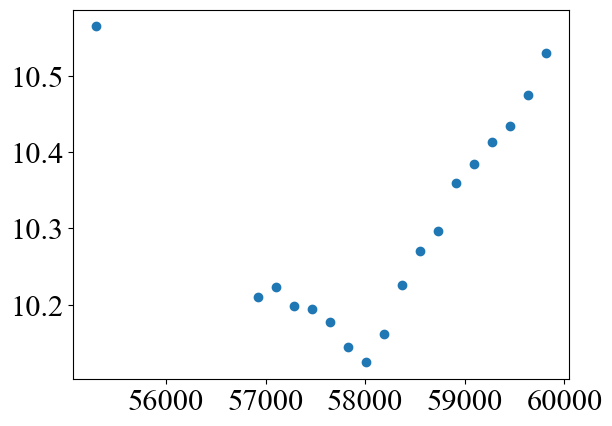

In [24]:
plt.scatter(whdu[whdu['plateifu']=='8717-1902']['mjd'][0], whdu[whdu['plateifu']=='8717-1902']['mean_W2_per_epoch'][0])

In [22]:
whdu[whdu['plateifu']=='8145-6102']['mean_W2_per_epoch']

array([[14.08 , 14.874,    nan,    nan,    nan, 14.308,    nan,    nan,
           nan,    nan,    nan, 14.739,    nan,    nan,    nan, 14.012,
           nan,    nan,    nan,    nan,    nan,    nan,    nan,    nan,
           nan,    nan]], dtype='>f8')

In [17]:
w1, w2, ssfr = np.array([]), np.array([]), np.array([])

for plateifu in pifuv:
    w1 = np.append(w1, sps2[sps2['plateifu']==plateifu]['maggies'][:, 5])
    w2 = np.append(w2, sps2[sps2['plateifu']==plateifu]['maggies'][:, 6])
    ssfr = np.append(ssfr, pipe3d_matched[pipe3d_matched['plateifu']==plateifu]['log_SFR_ssp']-pipe3d_matched[pipe3d_matched['plateifu']==plateifu]['log_mass'])
w1_app = -2.5 * np.log10(w1)
w2_app = -2.5 * np.log10(w2)

w12 = w1_app-w2_app

In [18]:
pifu_blue = pifuv[w12<w1w2_condition(ssfr)]

In [19]:
pifu_blue

array(['9870-1902', '8145-6102', '8341-12704', '7977-9101', '9487-3702',
       '9870-9101', '7972-12701', '9024-12705', '8992-12702',
       '11978-6103', '9048-1902', '8313-6101', '11025-9102', '11981-6104',
       '11833-3702', '11974-12701', '8483-12701', '8549-12702',
       '9889-12705', '8132-6102', '9502-12703', '9892-6102', '8447-9102',
       '8718-12701', '10216-12704', '8158-3704', '11838-1902',
       '9036-6101', '12078-6102', '9031-12705', '8322-3701', '7991-6104',
       '10516-12701', '8091-9101', '8487-9102', '9498-3703',
       '11746-12704', '8998-12705', '10845-12701', '12514-9102',
       '8626-12702', '10217-3704', '8093-9102', '12683-6102',
       '10224-3704', '10837-3701', '12085-1902', '11757-12704',
       '8950-6102', '9032-12702', '8619-12702', '9030-12702',
       '12511-3702', '9193-9101', '8333-3703', '8152-9102', '8248-6102',
       '8318-3704', '9867-6104', '11954-1901', '8616-12701', '8564-3701',
       '8723-3702', '9507-12705', '8262-9101', '8334-3

In [20]:
w2 = []
w1 = []

w2_err = []
w1_err = []

times = []
manga_date = []

for i in pifu_blue:
    date = Time(whdu[whdu['plateifu'] == i]['mjd'], format='mjd')
    times.append(date.to_value('decimalyear').reshape(-1))
    
    w2.append(whdu[whdu['plateifu'] == i]['mean_W2_per_epoch'].reshape(-1))
    w1.append(whdu[whdu['plateifu'] == i]['mean_W1_per_epoch'].reshape(-1))
    
    w2_err.append(whdu[whdu['plateifu'] == i]['std_err_W2_per_epoch'].reshape(-1))
    w1_err.append(whdu[whdu['plateifu'] == i]['std_err_W1_per_epoch'].reshape(-1))
    
    mdate = Time(manga_data[manga_data['plateifu'] == i]['mjdmed'], format='mjd')
    manga_date.append(mdate.to_value('decimalyear').reshape(-1))

C:\Users\paiaa\anaconda3\Lib\site-packages\erfa\core.py:154: ErfaWarning: ERFA function "d2dtf" yielded 2 of "dubious year (Note 5)"
  warnings.warn('ERFA function "{}" yielded {}'.format(func_name, wmsg),
C:\Users\paiaa\anaconda3\Lib\site-packages\erfa\core.py:154: ErfaWarning: ERFA function "dtf2d" yielded 2 of "dubious year (Note 6)"
  warnings.warn('ERFA function "{}" yielded {}'.format(func_name, wmsg),
C:\Users\paiaa\anaconda3\Lib\site-packages\erfa\core.py:154: ErfaWarning: ERFA function "dtf2d" yielded 4 of "dubious year (Note 6)"
  warnings.warn('ERFA function "{}" yielded {}'.format(func_name, wmsg),
C:\Users\paiaa\anaconda3\Lib\site-packages\erfa\core.py:154: ErfaWarning: ERFA function "d2dtf" yielded 10 of "dubious year (Note 5)"
  warnings.warn('ERFA function "{}" yielded {}'.format(func_name, wmsg),
C:\Users\paiaa\anaconda3\Lib\site-packages\erfa\core.py:154: ErfaWarning: ERFA function "dtf2d" yielded 10 of "dubious year (Note 6)"
  warnings.warn('ERFA function "{}" yield

In [21]:
for i, array in enumerate(w2):
    ind = np.isfinite(array)
    
    w2[i] = array[ind]
    w1[i] = w1[i][ind]
    
    w2_err[i] = w2_err[i][ind]
    w1_err[i] = w1_err[i][ind]
    times[i] = times[i][ind]
  

In [25]:
X = times
Y = w2

N = 0 
gp_x = []
gp_meanpred, gp_stdpred = [], []
for i in range(50):
    X = times[i]
    Y = w2[i]
    Y_err = w2_err[i]
    Y_err[~np.isfinite(Y_err)] = 0
    #print(Y_err)
    #print(X)
    #print(Y)
    #print(X.shape, Y.shape)
    print(Y_err)
    Y_noise = np.random.normal(loc=0, scale=Y_err, size=Y_err.shape[0])
#     if i in [24, 28, 31, 37, 39, 41, 42, 44, 45]:
#         kernel =  1*Matern(length_scale=50, length_scale_bounds=(1, 1e3), nu=1.5)#RationalQuadratic(length_scale=1, length_scale_bounds=(1e-6, 1e6)) +
#         gaussian_process = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=20, alpha=Y_err**2)
#     else:
    kernel =  1*Matern(length_scale=1, length_scale_bounds=(1e-5, 1e1), nu=1.5)#RationalQuadratic(length_scale=1, length_scale_bounds=(1e-6, 1e6)) +
    gaussian_process = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=20, alpha=Y_err**2)
    
    x = np.linspace(min(X), max(X), 500)
    gaussian_process.fit(X.reshape(-1,1), Y+ Y_noise)
    mean_prediction, std_prediction = gaussian_process.predict(x.reshape(-1,1), return_std=True)

    gp_x.append(x)
    gp_meanpred.append(mean_prediction)
    gp_stdpred.append(std_prediction)
    print(gaussian_process.kernel_)

[0.01763196 0.02623371 0.03183454 0.03323646 0.03505402 0.03942834
 0.03239726 0.02643071 0.03562374 0.0529258  0.0347037  0.04615406
 0.01604348 0.01520358 0.01062498 0.00612374 0.01909489 0.01365811
 0.01486794]
8.55**2 * Matern(length_scale=10, nu=1.5)
[0.184 0.363 0.203 0.3   0.051]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


9.14**2 * Matern(length_scale=10, nu=1.5)
[0.0111517  0.01379756 0.01293788 0.01467026 0.00812353 0.00758056
 0.01227811 0.01556371 0.01443765 0.00707685 0.01973053 0.01266096
 0.01084839 0.010051   0.00978445 0.02327275 0.00994179 0.00719715
 0.01077069]
6.88**2 * Matern(length_scale=10, nu=1.5)
[0.0094395  0.01178158 0.0057401  0.0066077  0.00868588 0.00909555
 0.00831867 0.00952061 0.01088781 0.00545169 0.01282187 0.00851154
 0.00815252 0.00632753 0.00644257 0.01048481 0.00645615 0.00989531
 0.00995934]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


8.21**2 * Matern(length_scale=10, nu=1.5)
[0.01373496 0.01772779 0.01602358 0.01579288 0.01678225 0.02034657
 0.0271359  0.01728377 0.01072702 0.00911735 0.02723535 0.0141397
 0.01025517 0.01911435 0.01366006 0.01725228 0.01881714 0.0134966 ]
6.95**2 * Matern(length_scale=10, nu=1.5)
[0.01360528 0.01327834 0.01799999 0.01893238 0.00909139 0.01276488
 0.01128529 0.01304116 0.01052267 0.01610642 0.01673644 0.00931266
 0.01352145 0.01093038 0.00839501 0.00883184 0.01389617 0.01808825
 0.01021177]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


7.62**2 * Matern(length_scale=10, nu=1.5)
[0.07   0.0175]
9.43**2 * Matern(length_scale=10, nu=1.5)
[0.01270073 0.055      0.0479279  0.063      0.01135782 0.03
 0.063      0.052      0.099      0.05981987 0.02593903 0.063
 0.0755     0.066     ]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


6.69**2 * Matern(length_scale=10, nu=1.5)
[0.01126202 0.01020262 0.01058539 0.01235001 0.0121502  0.0092499
 0.00712202 0.00770089 0.00758513 0.01163796 0.0108468  0.0099606
 0.00777465 0.00971252 0.01010292 0.00782052 0.01043386 0.00820391
 0.01163011]
4.62**2 * Matern(length_scale=10, nu=1.5)
[0.01284857 0.02266669 0.07250231 0.03154965 0.01277075 0.00832345
 0.0213533  0.01493142 0.03521792 0.02536825 0.02227415 0.02260852
 0.01947983 0.00940528 0.02860061 0.01357128 0.00949388 0.00814555
 0.01397214]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


7.64**2 * Matern(length_scale=10, nu=1.5)
[0.01283638 0.01554332 0.00716526 0.01535466 0.01146893 0.01655248
 0.01328885 0.00889225 0.0172298  0.01160856 0.01600026 0.0109074
 0.0296005  0.01450728 0.01352288 0.01082988 0.02431915 0.01238207
 0.0207872 ]
6.34**2 * Matern(length_scale=10, nu=1.5)
[0.01373975 0.01112475 0.01113586 0.0073733  0.00891756 0.01121885
 0.00724404 0.01037751 0.01466472 0.00860552 0.01385427 0.01198999
 0.0100755  0.01429528 0.01477792 0.00905632 0.0119733  0.01419555
 0.01235012 0.01122929]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


6.88**2 * Matern(length_scale=10, nu=1.5)
[0.02  0.088 0.066]
7.5**2 * Matern(length_scale=10, nu=1.5)
[0.01443058 0.01631379 0.01250462 0.01258919 0.02157712 0.01006465
 0.00748688 0.00983359 0.00836421 0.00773893 0.00833165 0.01779978
 0.01165522 0.01327243 0.00813053 0.00908706 0.02294205 0.01234317
 0.013569  ]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


4.92**2 * Matern(length_scale=10, nu=1.5)
[0.00914763 0.00780209 0.00812445 0.00536007 0.0083329  0.00838981
 0.00711939 0.00488866 0.00905457 0.00557188 0.00536949 0.00625939
 0.00711362 0.00668844 0.00962004 0.00517551 0.00675219 0.0044847
 0.01081198]
7.14**2 * Matern(length_scale=10, nu=1.5)
[0.02381027 0.04062867 0.03441523 0.02245087 0.02453902 0.03108072
 0.03635874 0.02173168 0.04515113 0.02728173 0.02269077 0.07750808
 0.01354509 0.04076598 0.02308381 0.05169211 0.02736587 0.04275818
 0.04221813]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


7.99**2 * Matern(length_scale=10, nu=1.5)
[0.153  0.015  0.245  0.305  0.0275 0.157 ]
7.82**2 * Matern(length_scale=10, nu=1.5)
[0.00734765 0.01321283 0.00690731 0.00534464 0.00755054 0.00421839
 0.0078572  0.01095214 0.00925775 0.00702848 0.00966822 0.0072259
 0.0113016  0.00624179 0.00742408 0.01042968 0.00893989 0.00850414
 0.01037794 0.00663757]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


8.21**2 * Matern(length_scale=10, nu=1.5)
[0.01793135 0.0206812  0.094      0.05240865 0.0075     0.0965
 0.02000833 0.01709776 0.049      0.048      0.035      0.05
 0.04564111 0.04416352 0.02500889 0.03404761 0.03609863 0.0325
 0.01102554 0.01300154]
4.7**2 * Matern(length_scale=10, nu=1.5)
[0.03827331 0.118      0.117      0.139      0.02377908 0.085
 0.127     ]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


6.24**2 * Matern(length_scale=10, nu=1.5)
[0.00981818 0.052      0.0086979  0.00923955 0.00820704 0.01596205
 0.01156086 0.00822313 0.00805944 0.00462172 0.02192366 0.00802973
 0.01397084 0.00592116 0.00500591 0.00766498 0.00780212 0.02282666
 0.01375091]
4.83**2 * Matern(length_scale=10, nu=1.5)
[0.01130338 0.0060856  0.00853304 0.00957299 0.00786804 0.00724777
 0.00952934 0.00524882 0.00644465 0.01396269 0.00902806 0.00672514
 0.01129887 0.00591077 0.01523129 0.00726407 0.0105912  0.00702553
 0.00747325]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


6.77**2 * Matern(length_scale=10, nu=1.5)
[0.06560572 0.068      0.06       0.04517743 0.0255     0.175
 0.003      0.08448077 0.096      0.006      0.072      0.067
 0.076      0.04572502 0.05373081 0.01222361]
5.24**2 * Matern(length_scale=10, nu=1.5)
[0.02307974 0.02684461 0.04226461 0.02929877 0.0244548  0.0248626
 0.02231606 0.02747588 0.02267355 0.02200521 0.01850785 0.03289272
 0.02931683 0.01759328 0.02711352 0.03601361 0.02937996 0.01516398]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


6.38**2 * Matern(length_scale=10, nu=1.5)
[0.01292847 0.01636409 0.01530867 0.01360896 0.00971497 0.0137766
 0.0121422  0.01709724 0.03420599 0.01073166 0.01240918 0.02450667
 0.00900288 0.0162181  0.01441418 0.01325305 0.02899435 0.01501287]
3.85**2 * Matern(length_scale=10, nu=1.5)
[0.01554075 0.03700775 0.02373883 0.0208347  0.08547476 0.03509065
 0.03897191 0.02151882 0.02774643 0.02472538 0.02240891 0.0224214
 0.05054663 0.04036418 0.0396423  0.04162505 0.03012201 0.05149924
 0.07992747]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


5.91**2 * Matern(length_scale=10, nu=1.5)
[0.01154946 0.01334036 0.01235762 0.0050082  0.01160913 0.00979511
 0.00960579 0.00730694 0.01071856 0.0115706  0.01079595 0.00866687
 0.01991215 0.00797983 0.01128101 0.01015794 0.01609928 0.00893488
 0.01465849]
4.65**2 * Matern(length_scale=10, nu=1.5)
[0.01392068 0.0228958  0.01763015 0.01664477 0.02136595 0.01585455
 0.01624785 0.01580237 0.02014988 0.01796812 0.02459596 0.02503133
 0.02118585 0.01606098 0.01418005 0.0276428  0.01611585 0.02906249
 0.02447339 0.02242218]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


5.51**2 * Matern(length_scale=10, nu=1.5)
[0.0275968  0.034      0.03038194 0.033      0.011891   0.029
 0.00924211 0.02167164 0.02787024 0.01392465 0.0045     0.02657497
 0.01325707 0.036      0.02346866 0.02656614 0.0117618  0.03658931
 0.01386146 0.01965073]
4.42**2 * Matern(length_scale=10, nu=1.5)
[0.01392068 0.0228958  0.01763015 0.01664477 0.02136595 0.01585455
 0.01624785 0.01580237 0.02014988 0.01796812 0.02459596 0.02503133
 0.02118585 0.01606098 0.01418005 0.0276428  0.01611585 0.02906249
 0.02447339 0.02242218]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


4.27**2 * Matern(length_scale=10, nu=1.5)
[0.00968596 0.00755711 0.01303483 0.01569239 0.00940105 0.00912638
 0.01222215 0.0128455  0.01149778 0.01123577 0.01243043 0.01062917
 0.02210973 0.01544446 0.01089657 0.00871707 0.01247018 0.00962309
 0.01649836]
5.39**2 * Matern(length_scale=10, nu=1.5)
[0.00824198 0.02775409 0.0076598  0.00669194 0.00631487 0.01772748
 0.00676488 0.00734917 0.00959884 0.01360578 0.00929569 0.0108637
 0.01039207 0.01073875 0.01190594 0.00797201 0.00882107 0.01186949
 0.01246981]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


6.37**2 * Matern(length_scale=10, nu=1.5)
[0.01029386 0.01000587 0.01205703 0.00741753 0.00649179 0.00869378
 0.00846212 0.00611748 0.00584501 0.00863876 0.00843907 0.00846592
 0.01046099 0.00853099 0.00824822 0.01257309 0.01145173 0.00986289
 0.00904868]
5.59**2 * Matern(length_scale=10, nu=1.5)
[0.01293879 0.00954055 0.01324868 0.02066817 0.02374744 0.01344822
 0.01039771 0.01683403 0.0095342  0.01655773 0.01433181 0.01312037
 0.02024552 0.01839785 0.01632581 0.01177204 0.01049041 0.01022474
 0.01917445]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


6.21**2 * Matern(length_scale=10, nu=1.5)
[0.01964193 0.03983926 0.0287518  0.02704759 0.02620067 0.02355448
 0.02645249 0.02375952 0.01715667 0.01337146 0.02256309 0.02017603
 0.01639699 0.03563608 0.0194135  0.03624647 0.02198598 0.03040424
 0.03455621 0.02038349]
9.11**2 * Matern(length_scale=10, nu=1.5)
[0.00741769 0.01315869 0.00949987 0.011987   0.00676461 0.0090321
 0.01210812 0.01455427 0.01182564 0.01537014 0.01714879 0.01212591
 0.01255437 0.01364566 0.01320105 0.01054839 0.00975021 0.00799928]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


4.16**2 * Matern(length_scale=10, nu=1.5)
[0.00893267 0.01579486 0.01734666 0.0215883  0.01354591 0.02638797
 0.01578494 0.03015376 0.01403754 0.01257453 0.01256337 0.02276415
 0.05946878 0.0211238  0.01698025 0.02215303 0.02826716 0.02435349]
4.8**2 * Matern(length_scale=10, nu=1.5)
[0.01736546 0.01657193 0.01601309 0.01573505 0.02005309 0.02216911
 0.01405446 0.01484552 0.01146783 0.02301209 0.01422103 0.0197941
 0.01744461 0.02073021 0.01658791 0.0211891  0.01630012 0.01370882
 0.01171733]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


4.59**2 * Matern(length_scale=10, nu=1.5)
[0.02016769 0.00835091 0.01255494 0.01690389 0.01547773 0.02602351
 0.01107565 0.01316872 0.01778809 0.01183709 0.01203121 0.00969992
 0.00716402 0.01370938 0.01898538 0.00644141 0.02150276 0.01408405
 0.01939659]
5.74**2 * Matern(length_scale=10, nu=1.5)
[0.01622682 0.02296573 0.0103591  0.0080457  0.01170362 0.01104783
 0.01213267 0.01104863 0.01202873 0.01645293 0.02366582 0.0111871
 0.0102059  0.01972006 0.0143779  0.0268185  0.01949503 0.01566245
 0.0131092 ]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


3.9**2 * Matern(length_scale=10, nu=1.5)
[0.00439802 0.00793096 0.0058606  0.00680099 0.0067849  0.00644594
 0.00678003 0.00723955 0.00447207 0.00504217 0.00889809 0.00533234
 0.01188402 0.00809405 0.00552259 0.01061752 0.00925683 0.00695394
 0.00674342]
3.92**2 * Matern(length_scale=10, nu=1.5)
[0.02211499 0.03654313 0.02297281 0.03083559 0.0505     0.013
 0.007932   0.02107394 0.06139478 0.00798305 0.023      0.05002571
 0.0226892  0.01474223 0.092      0.083      0.0765    ]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


4.99**2 * Matern(length_scale=10, nu=1.5)
[0.01927537 0.00626135 0.02022767 0.03247273 0.01281798 0.00898125
 0.01787221 0.10737269 0.01348706 0.01195075 0.00969818 0.00889108
 0.01952309 0.00895591 0.01427258 0.00990953 0.01083942 0.03222251
 0.01378627 0.01984822]
3.8**2 * Matern(length_scale=10, nu=1.5)
[0.02450468 0.02703099 0.02373814 0.04238445 0.03330324 0.0249556
 0.02238598 0.04266243 0.04379073 0.01613549 0.04348478 0.03100534
 0.02676432 0.02614552 0.03084837 0.04056473 0.02485864 0.03588225
 0.0218878 ]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


5.51**2 * Matern(length_scale=10, nu=1.5)
[0.117 0.042 0.006]
7.48**2 * Matern(length_scale=10, nu=1.5)
[0.01187469 0.02268923 0.01411722 0.01124731 0.03801536 0.00967538
 0.02009379 0.00936655 0.01906318 0.02314832 0.01384243 0.02094301
 0.01386004 0.02296456 0.01755275 0.01657545 0.01524992 0.01706021
 0.01772685]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


5**2 * Matern(length_scale=10, nu=1.5)
[0.02749426 0.03915922 0.02297247 0.01916415 0.135      0.02462906
 0.02517255 0.03651476 0.02111156 0.04677956 0.02622452 0.02754833
 0.05065527 0.03053473]
5.22**2 * Matern(length_scale=10, nu=1.5)
[0.01080439 0.00994291 0.0095313  0.01017369 0.01172687 0.00725383
 0.0072411  0.0070076  0.0129725  0.01085469 0.00957261 0.00637955
 0.01038808 0.00668187 0.02559742 0.01293252 0.01693576 0.02037357
 0.01509144]


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


4.53**2 * Matern(length_scale=10, nu=1.5)
[0.04998778 0.019      0.03154461]
6.86**2 * Matern(length_scale=10, nu=1.5)
[0.01610081 0.02753015 0.01563755 0.03066912 0.01480368 0.02923165
 0.01418804 0.0232003  0.01931866 0.01979958 0.01464484 0.03358117
 0.01904167 0.02180048 0.03339443 0.01475375 0.02820311 0.02178226
 0.08128907]
5.8**2 * Matern(length_scale=10, nu=1.5)


C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
C:\Users\paiaa\anaconda3\Lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__length_scale is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


10it [00:00, 127.31it/s]
10it [00:00, 87.95it/s]
10it [00:00, 118.74it/s]
10it [00:00, 116.19it/s]
10it [00:00, 107.90it/s]


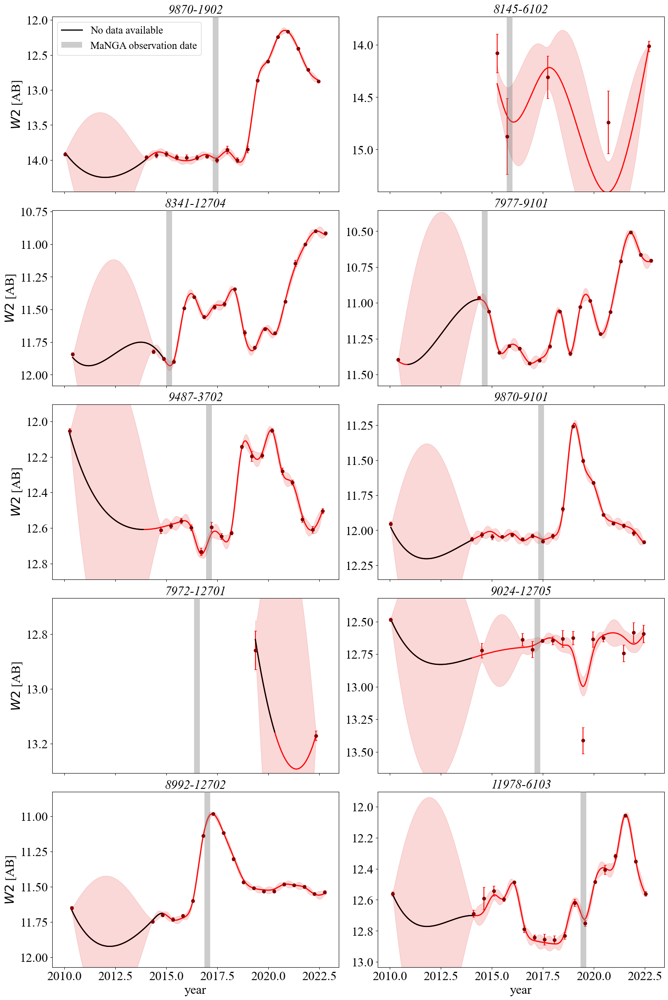

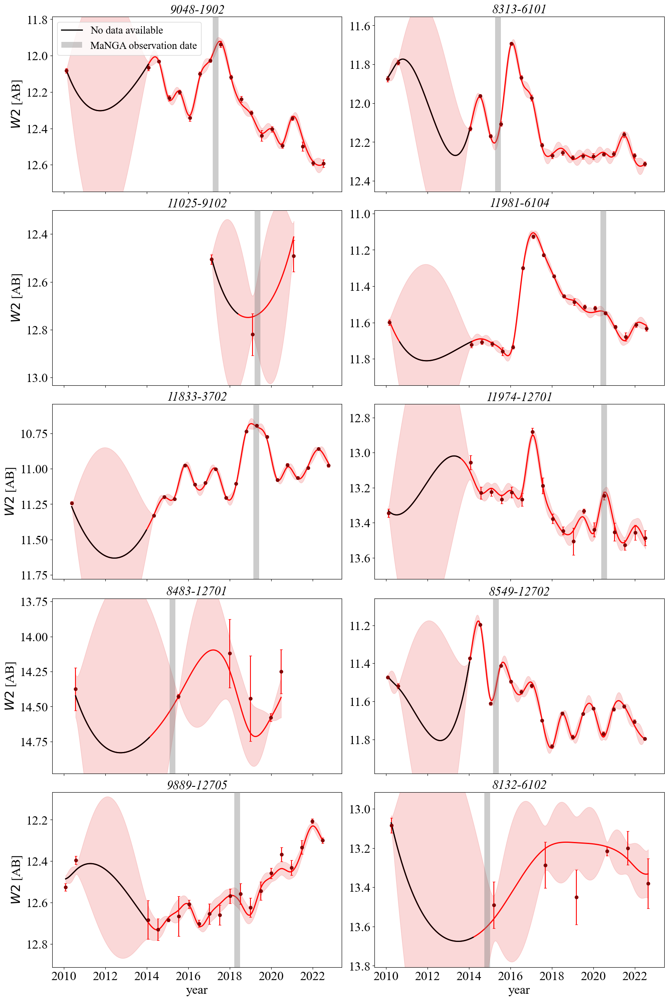

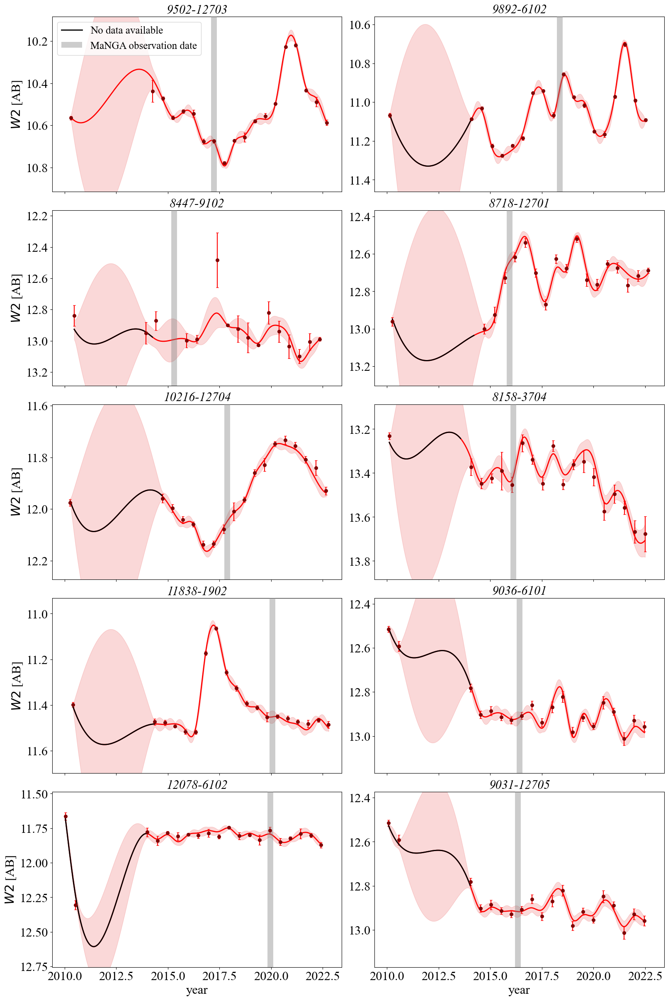

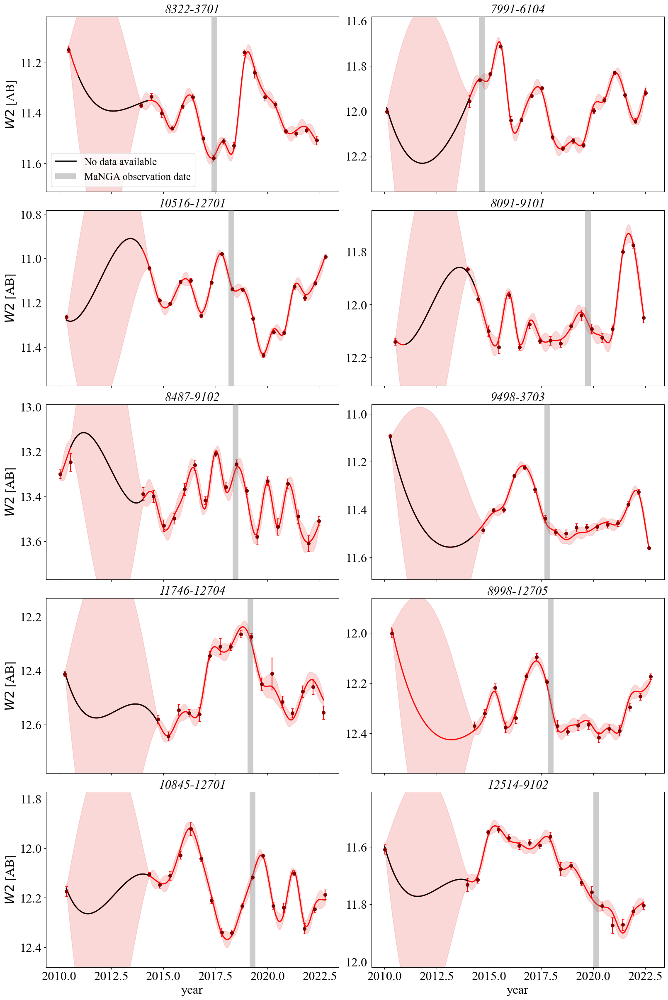

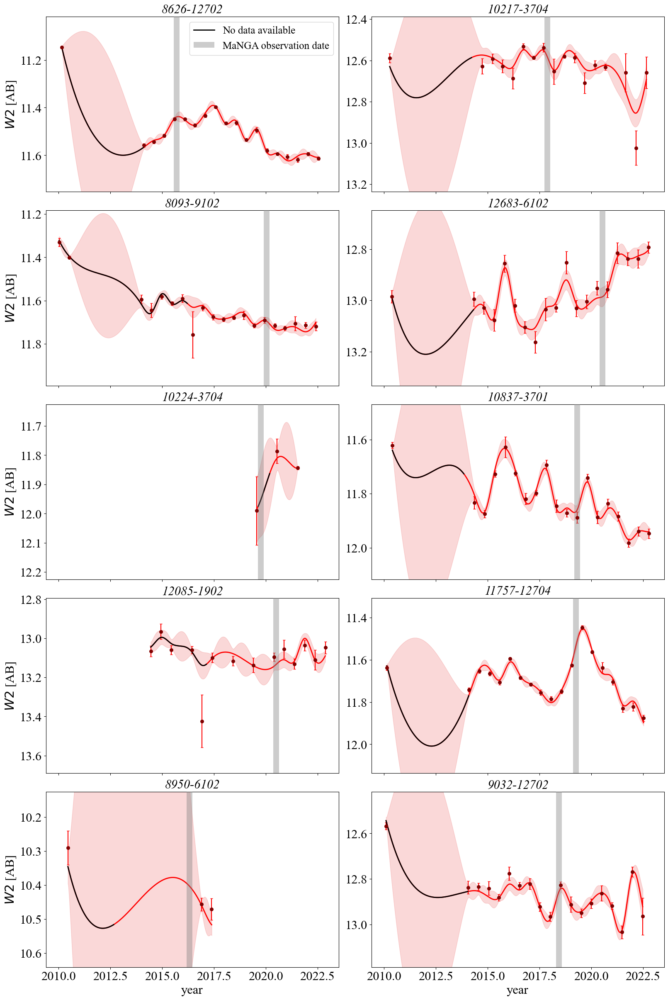

In [26]:
index = np.arange(0, 50, 10)
for i in index:
    
    fig, axes = plt.subplots(figsize=(16, 24), ncols=2, nrows=5, sharex=True, constrained_layout=True)
    
    for j, ax in tqdm(enumerate(axes.ravel())):
        if i+j > pifu_blue.shape[0]:
            ax.set_axes_off()
            continue
        
        if i+j in [3, 13, 30, 33, 34, 43]:
            ax.plot(gp_x[i+j][indices[i+j][0]:indices[i+j][1]], gp_meanpred[i+j][indices[i+j][0]:indices[i+j][1]], lw=2, ls='-', c='k', zorder=4, label='No data available')
        elif i+j in [1, 20, 37]:
            ax.plot(gp_x[i+j][indices[i+j][0]:indices[i+j][0]], gp_meanpred[i+j][indices[i+j][0]:indices[i+j][0]], lw=2, ls='-', c='k', zorder=4, label='No data available')

        elif i+j not in [1, 20, 37, 3, 13, 30, 33, 34, 43]:
            ax.plot(gp_x[i+j][indices[i+j][0]:indices[i+j][1]], gp_meanpred[i+j][indices[i+j][0]:indices[i+j][1]], lw=2, ls='-', c='k', zorder=4, label='No data available')
        
        ax.errorbar(times[i + j], w2[i + j], yerr=w2_err[i + j], ls='none', capsize = 2, elinewidth = 1.5,  linewidth = 1.5, color = 'red', marker = 'o', mfc = 'maroon', markersize = 4, markevery = 1)
        ymin, ymax = ax.get_ylim()
        ax.plot(gp_x[i + j], gp_meanpred[i + j], c='red', lw=2)

        ax.vlines(manga_date[i + j], ymin=ymin-0.2, ymax=ymax+0.2, lw=10, color='gray', zorder=4, alpha=0.4, label='MaNGA observation date')
        ax.scatter(times[i + j], w2[i + j], color='maroon', s=30,zorder=5)
        ax.fill_between(gp_x[i + j], gp_meanpred[i + j] - gp_stdpred[i + j], gp_meanpred[i + j] + gp_stdpred[i + j], alpha=0.3, color='lightcoral')

        ax.set_ylim(ymin-0.1, ymax+0.1)
        ax.invert_yaxis()
                

        if j in [0]:
            ax.legend(fontsize=18)
        if j in [0,2,4,6,8]:
            ax.set_ylabel(r'$W2$ [AB]',fontsize=22)
        if j in [8,9]:
            ax.set_xlabel('year', fontsize=22)
            ax.xaxis.set_tick_params(labelbottom=True)
        ax.set_title(pifu_blue[i+j], fontsize = 22, fontstyle='oblique')
        ax.tick_params(axis='both', labelsize=22)
    
    #plt.savefig(SAVE_FILEPATH + '/WISE lightcurves/' + 'lightcurves_gp_errors' + str(i//10) + '.png',  bbox_inches = 'tight', pad_inches = 0.1, dpi = 300)

In [29]:
np.intersect1d(pifu, pifu_blue).shape[0]

29